#Abstract
The dataset contains count of public bicycles rented per hour in the Seoul Bike Sharing System, with corresponding weather data and holiday information. The aim of the Notebook is to combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report

Dataset will be fetched from GitHub
The data set consists of : Rented Bike Count - Dependent Variable Date, Hour, Temperature(°C), Humidity(%), Wind speed (m/s), Visibility (10m), Dew point temperature(°C), Solar Radiation (MJ/m2), Rainfall(mm), Snowfall (cm), Seasons, Holiday, Functioning Day - Independent variable

There are a total of 8760 observations.

In [ ]:
!pip install wget
!wget https://raw.githubusercontent.com/HemantGaikwad7/INFO-6105-Data-Science-HemantGaikwad/Assignments/Assignment%202%20AutoML/SeoulBikeData.csv -O SeoulBikeData.csv

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=45478524a8d4d2d25d45194beb9d8ebd30957a9e748c31f136fb3ded0367b6bd
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
--2024-04-02 21:23:26--  https://raw.githubusercontent.com/HemantGaikwad7/INFO-6105-Data-Science-HemantGaikwad/Assignments/Assignment%202%20AutoML/SeoulBikeData.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 595405 (581K) [text/plain]
Saving to: ‘SeoulBikeData.csv’

SeoulBikeData.csv   100%[===================>] 581.45K  --.-KB/s    in 0.02s   

2024-04-02 21:23:26 (23.5 MB/s) - ‘SeoulBikeData.csv’ saved [595405/595405]



In [ ]:
!pip install chardet
import chardet
import pandas as pd
with open('SeoulBikeData.csv', 'rb') as f:
    encoding = chardet.detect(f.read())['encoding']
data = pd.read_csv('SeoulBikeData.csv', encoding=encoding)
data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
import chardet

In [ ]:
#Check if data is null
data.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

No data is missing from any of the columns, which means it is not required to impute or remove the null values from the data

<Figure size 800x500 with 0 Axes>

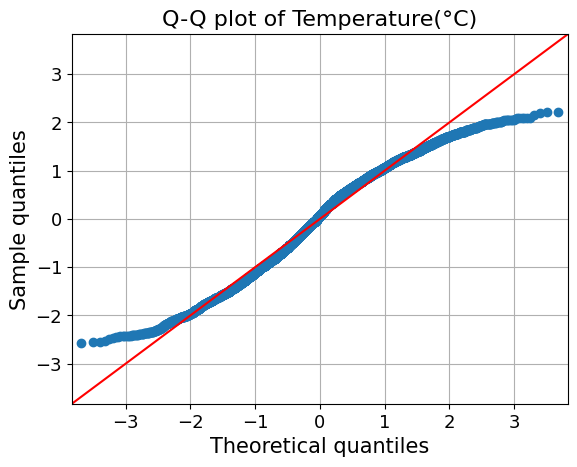

<Figure size 800x500 with 0 Axes>

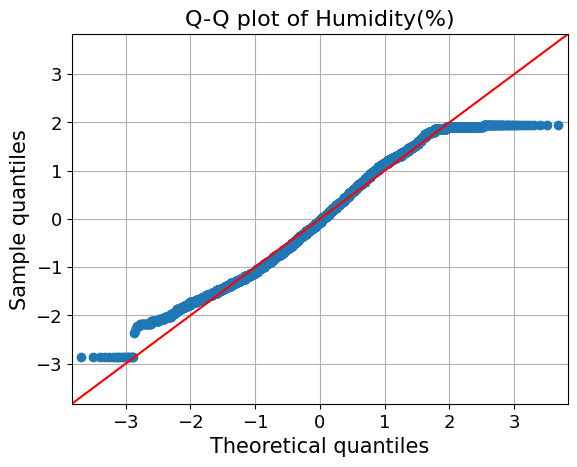

<Figure size 800x500 with 0 Axes>

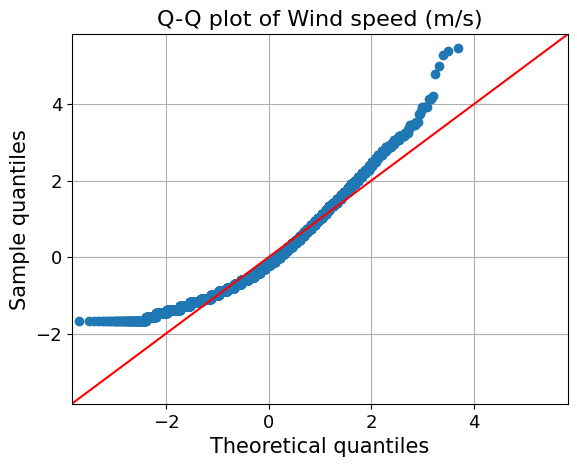

<Figure size 800x500 with 0 Axes>

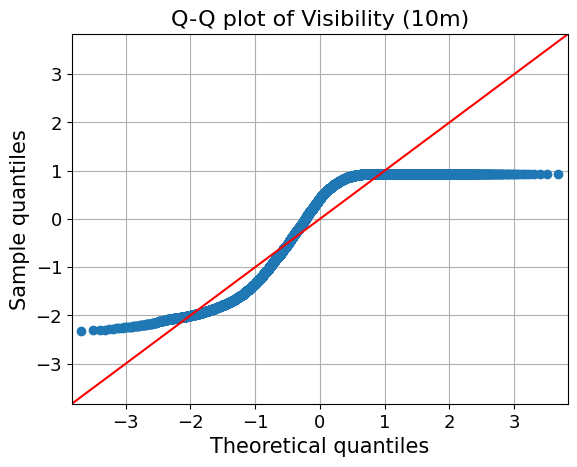

<Figure size 800x500 with 0 Axes>

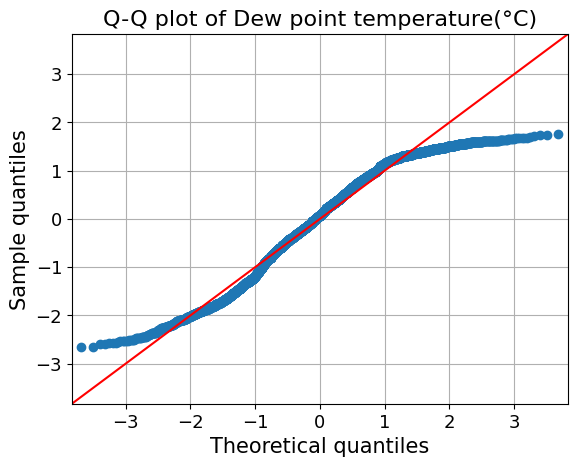

<Figure size 800x500 with 0 Axes>

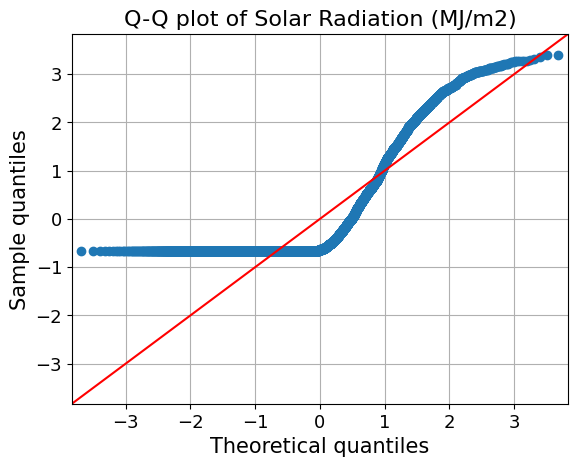

<Figure size 800x500 with 0 Axes>

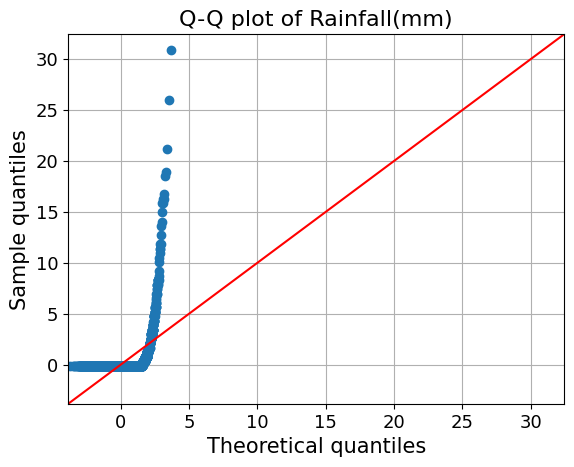

<Figure size 800x500 with 0 Axes>

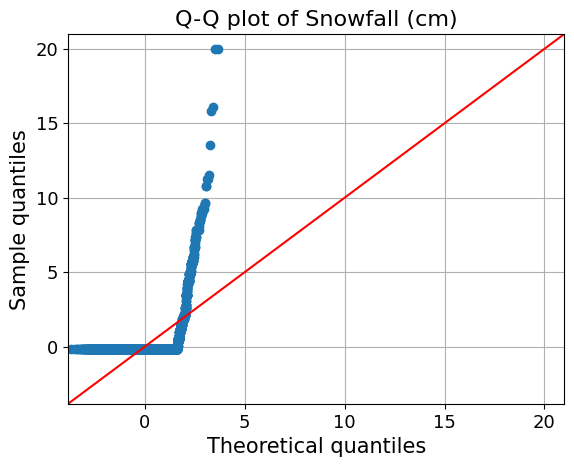

In [ ]:
# checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot

data_norm = data[
    ["Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

Above Q-Q plot shows almost all the independent variables are following normal distribution except rainfall and snowfall. An S-shaped curve in the Q-Q plot may indicate skewness in the data. Having said that there are few outliers, below could be the approximate observation

"Temperature(°C)" variable is following a normal distribution

"Humidity(%)" is following left skewed distribution.

"Wind speed (m/s)" is following a right-skewed distribution, and

"Solar Radiation (MJ/m2)" approximately following normal distribution

"Rain fall" and "Snowfall" are following heavy right skewed distribution

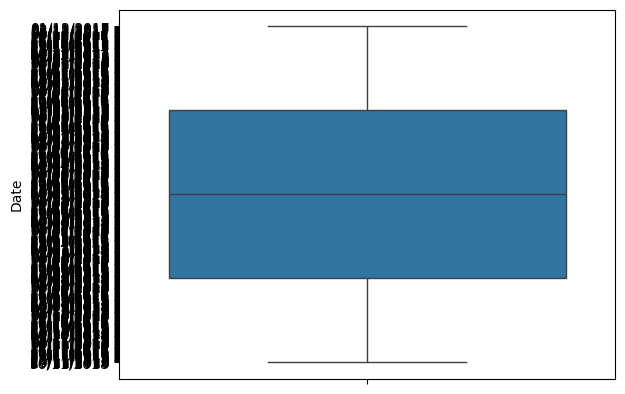

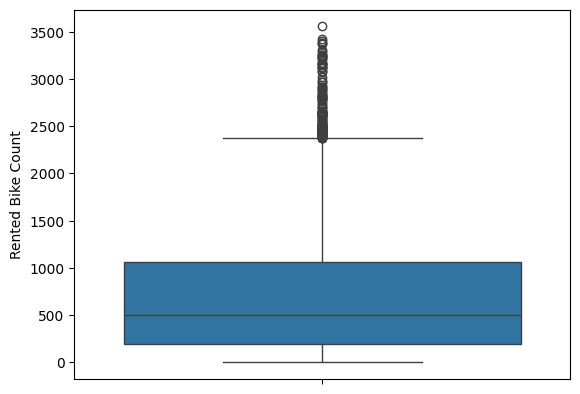

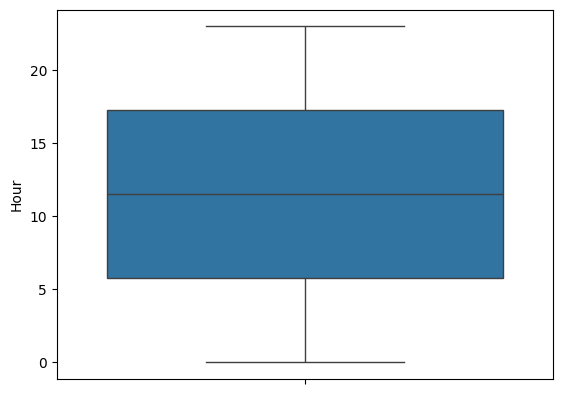

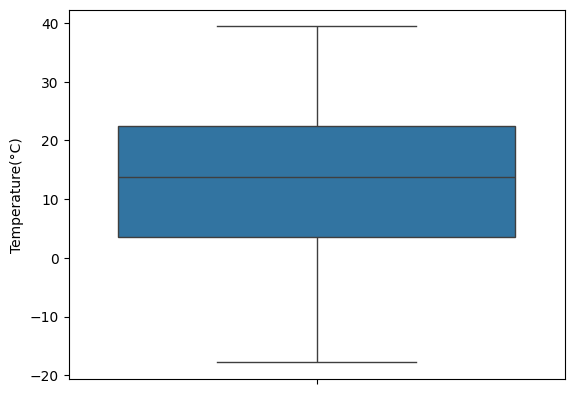

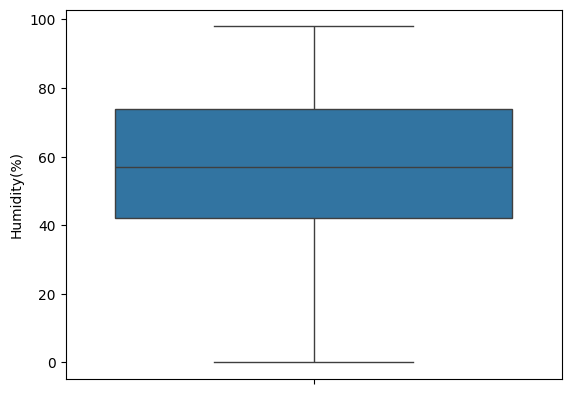

...

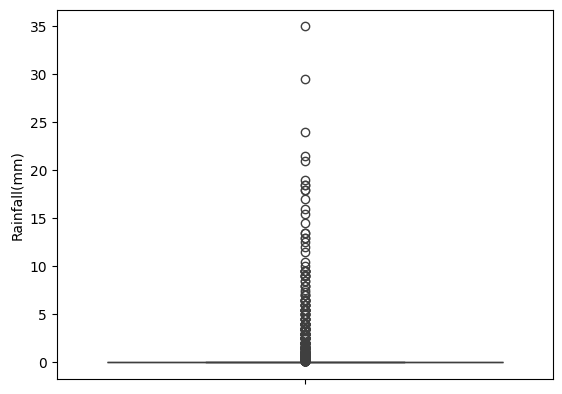

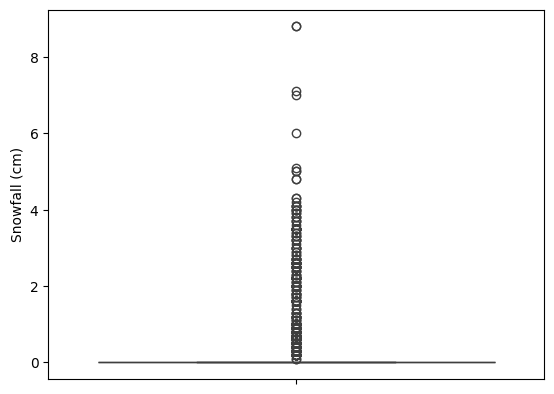

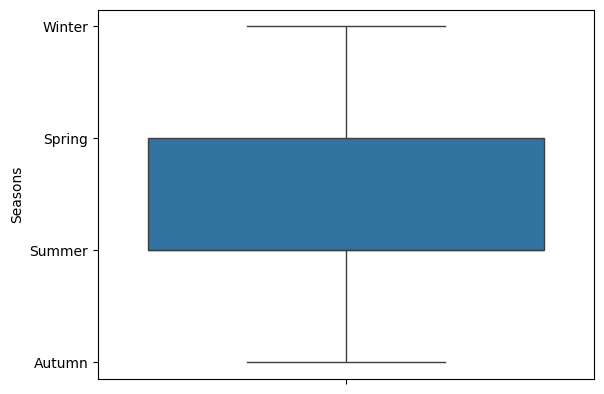

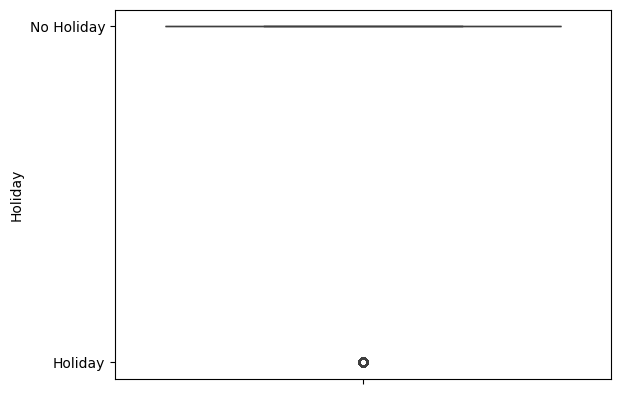

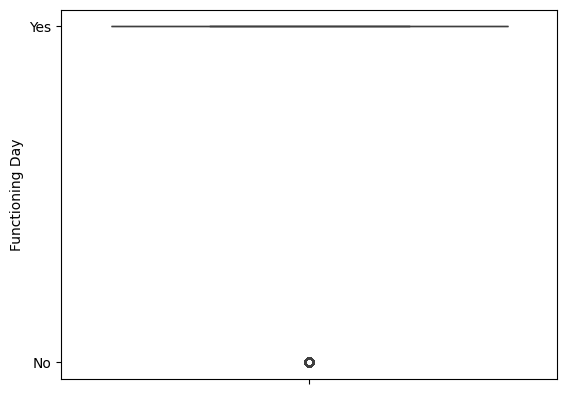

In [ ]:
# Checking the Ranges of the predictor variables and dependent variable

for column in data.columns:
    plt.figure()
    sns.boxplot(y=data[column])
    plt.show()

As per above plot we can conclude below points

Variables:

X-axis: This displays the different factors that might influence rented bike count. These include hour, temperature, humidity, wind speed, visibility, dew point temperature, solar radiation, rainfall, and snowfall.

Y-axis: This shows the number of bikes rented, ranging from 0 to 3500. Data points:

The boxplot doesn't reveal the exact number of data points, but it likely represents a sizable dataset considering the range of values on the y-axis.

Distribution:

The distribution of rented bike count appears somewhat skewed to the right. This means there are more data points towards the lower end of the y-axis, with a smaller tail extending towards higher bike counts.

Outliers:

There are a few outliers present, represented by individual points beyond the whiskers of the boxplots. These outliers indicate instances where the rented bike count was significantly higher or lower than the typical range for a given factor.

Groups:

The boxplot compares rented bike count across different levels of each factor on the x-axis. Each factor essentially acts as a separate group, allowing us to see how rented bike count varies according to each variable.

Key takeaways:

Hour, temperature, and humidity seem to have the most influence on rented bike count, as their boxplots exhibit the widest ranges and tend to be less squished together compared to other factors. Higher rented bike counts are generally associated with warmer temperatures, lower humidity, and specific hours of the day, potentially corresponding to peak leisure times. Rainfall and snowfall appear to have a negative impact on rented bike count, as their boxplots are skewed towards the lower end of the y-axis. The presence of outliers suggests that there can be unexpected fluctuations in rented bike count even under similar conditions.

##Correlation Analysis

In [ ]:
# checking the correlation between all the features in the data
data.corr()

<ipython-input-7-38a63e203d79>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804
Hour,0.410257,1.000000,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183
Wind speed (m/s),0.121108,0.285197,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887
Solar Radiation (MJ/m2),0.261837,0.145131,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301
Rainfall(mm),-0.123074,0.008715,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500
Snowfall (cm),-0.141804,-0.021516,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000


<ipython-input-8-0d33ea995755>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")


<Axes: >

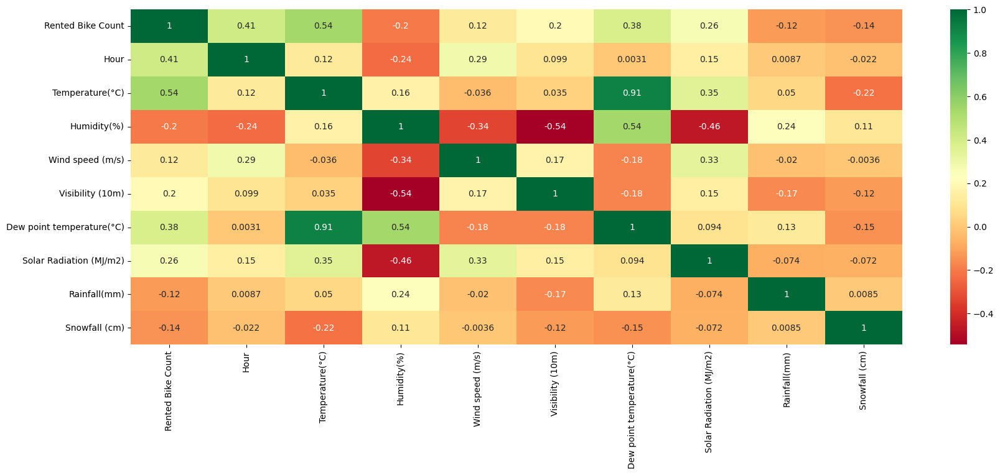

In [ ]:
# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")

Strongest Correlations:

Rented Bike Count: - Positively correlated with Temperature(°C) (0.538), indicating a tendency for higher bike rentals during warmer temperatures. - Moderately correlated with Hour (0.410), suggesting a relationship with time of day, potentially peak hours for bike usage. Other Notable Correlations:

Temperature(°C): - Strongly correlated with Dew point temperature(°C) (0.913), reflecting their close relationship in measuring atmospheric moisture. Humidity(%): - Negatively correlated with Wind speed (m/s) (-0.337) and Visibility (10m) (-0.543), suggesting that higher humidity often accompanies calmer winds and reduced visibility. Solar Radiation (MJ/m2): - Negatively correlated with Humidity(%) (-0.462), potentially indicating that cloudy or humid conditions can reduce solar radiation. Insights for Modeling and Prediction:

Feature Selection: The strong correlations between "Rented Bike Count" and "Temperature(°C)", "Hour", and potentially "Dew point temperature(°C)" suggest these variables could be useful predictors in a model for bike rental demand. Multicollinearity: The high correlation between "Temperature(°C)" and "Dew point temperature(°C)" might require addressing multicollinearity if both are included in a model, as they might provide redundant information.

#Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
# Prepare the data

non_numeric_columns = ['Date', 'Seasons', 'Holiday', 'Functioning Day']  # List of non-numeric columns
for col in non_numeric_columns:
    if data[col].dtype == 'object':
        le = LabelEncoder()
        data[col] = le.fit_transform(data[col])

# Prepare the data
X = data.drop('Solar Radiation (MJ/m2)', axis=1)  # Independent variables
y = data['Rented Bike Count']  # Target variable

# Train a Random Forest model
model = RandomForestRegressor()
model.fit(X, y)

# Access the feature importance
feature_importance = model.feature_importances_
print(feature_importance)

[1.59453245e-06 9.99987775e-01 1.46265387e-07 2.15021765e-06
 2.66606841e-06 2.92032823e-06 1.50462838e-06 8.22142993e-07
 1.72385926e-09 1.92071899e-10 3.98904423e-07 4.15898141e-09
 1.60834695e-08]


Features with higher importance values are more influential in making predictions. We can conclude that hour and temperature are most important parameters.

#Univariate Selection:

In [ ]:
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest

from sklearn.preprocessing import LabelEncoder
# Prepare the data

non_numeric_columns = ['Date', 'Seasons', 'Holiday', 'Functioning Day']  # List of non-numeric columns
for col in non_numeric_columns:
    if data[col].dtype == 'object':
        le = LabelEncoder()
        data[col] = le.fit_transform(data[col])

# Prepare the data
X = data[['Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)','Rainfall(mm)','Snowfall (cm)']]  # Independent variables
y = data['Rented Bike Count']  # Target variable

# Select the top k features
k = 5  # Number of top features to select
selector = SelectKBest(score_func=f_classif, k=k)
X_new = selector.fit_transform(X, y)
print(X_new)

[[-5.200e+00  3.700e+01  2.000e+03 -1.760e+01  0.000e+00]
 [-5.500e+00  3.800e+01  2.000e+03 -1.760e+01  0.000e+00]
 [-6.000e+00  3.900e+01  2.000e+03 -1.770e+01  0.000e+00]
 ...
 [ 2.600e+00  3.900e+01  1.968e+03 -9.900e+00  0.000e+00]
 [ 2.100e+00  4.100e+01  1.859e+03 -9.800e+00  0.000e+00]
 [ 1.900e+00  4.300e+01  1.909e+03 -9.300e+00  0.000e+00]]


The output of the code shows the transformed feature matrix (X_new) with the top 5 features. The values in the matrix are the transformed feature values, not the original values

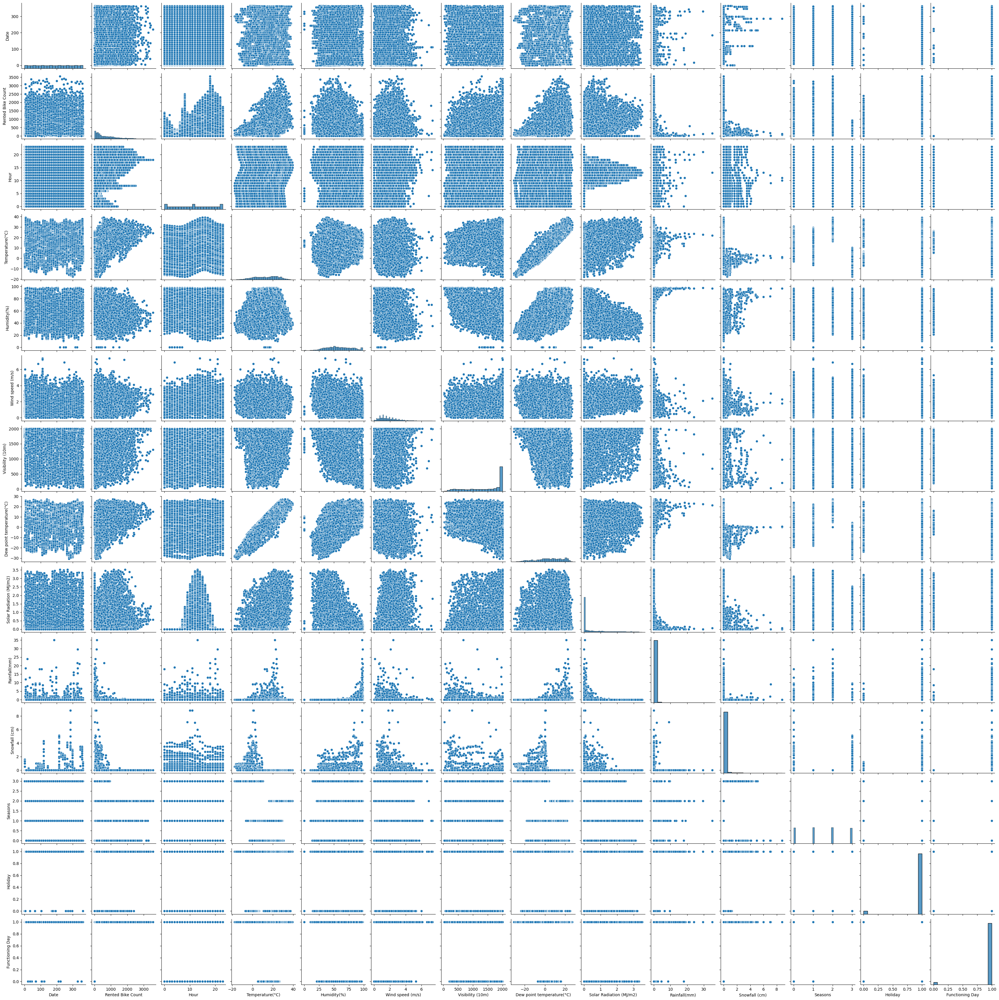

In [ ]:
# pair plot to check the colinearity
sns.pairplot(data)

#Identifing predictor significance

In [ ]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    data["Rented Bike Count"],
    data[
        [
          "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Rented Bike Count   R-squared (uncentered):                   0.724
Model:                            OLS   Adj. R-squared (uncentered):              0.723
Method:                 Least Squares   F-statistic:                              2863.
Date:                Tue, 02 Apr 2024   Prob (F-statistic):                        0.00
Time:                        21:25:48   Log-Likelihood:                         -66909.
No. Observations:                8760   AIC:                                  1.338e+05
Df Residuals:                    8752   BIC:                                  1.339e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Temperature(°C)              66.9774      1.648     40.647      0.000      63.747      70.207
Humidity(%)                  -1.2248      0.196     -6.250      0.000      -1.609      -0.841
Wind speed (m/s)             55.1557      5.671      9.727      0.000      44.040      66.271
Visibility (10m)              0.0199      0.010      1.924      0.054      -0.000       0.040
Dew point temperature(°C)   -33.5953      1.530    -21.957      0.000     -36.595     -30.596
Solar Radiation (MJ/m2)    -123.2678      8.683    -14.196      0.000    -140.289    -106.246
Rainfall(mm)                -56.0617      4.903    -11.434      0.000     -65.672     -46.451
Snowfall (cm)                33.4346     12.815      2.609      0.009       8.314      58.555
==============================================================================
Omnibus:                      964.502   Durbin-Watson:                   0.338
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1585.356
Skew:                           0.778   Prob(JB):                         0.00
Kurtosis:                       4.387   Cond. No.                     3.74e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.74e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Significant Predictors (p-value < 0.05):

Temperature(°C) (p-value ~ 0.000)
Humidity(%) (p-value ~ 0.000)
Wind speed (m/s) (p-value ~ 0.000)
Dew point temperature(°C) (p-value ~ 0.000)
Solar Radiation (MJ/m2) (p-value ~ 0.000)
Rainfall(mm) (p-value ~ 0.000)
Snowfall (cm) (p-value ~ 0.009)

Marginally Significant Predictor:

Visibility (10m) (p-value ~ 0.054)
Model Performance:

R-squared (uncentered): 0.724, indicating that the model explains about 72.4% of the variation in the bike count.
F-statistic: 2863, suggesting that the model as a whole is statistically significant.
Concerns:

Condition Number: The large condition number (3.74e+03) raises concerns about potential multicollinearity or other numerical problems. This could affect the stability of the coefficients and make interpretation less reliable.
Non-robust Covariance Type: The default "nonrobust" covariance type assumes that the errors are normally distributed and homoscedastic (constant variance). If these assumptions are violated, the standard errors and p-values might be unreliable.

#Building the Model
Train ,Validation and Test split

In [ ]:
from sklearn.model_selection import train_test_split

X = data[
    [
       "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
    ]
]

y = data["Rented Bike Count"]

# Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(
    X_t, y_t, test_size=0.15, random_state=1)

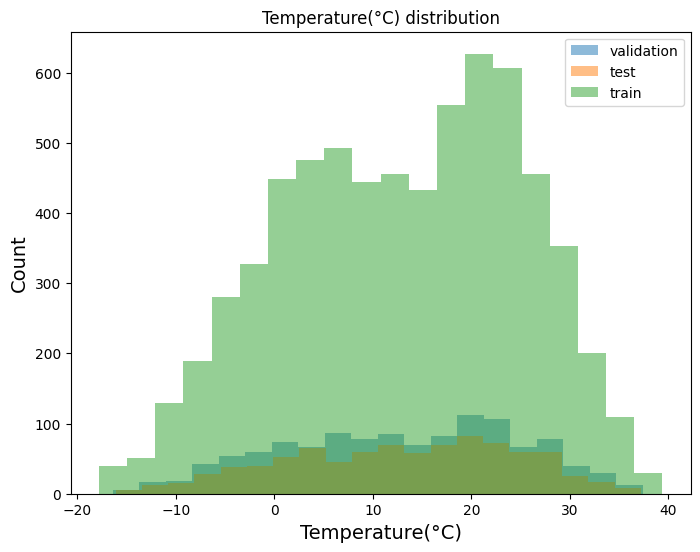

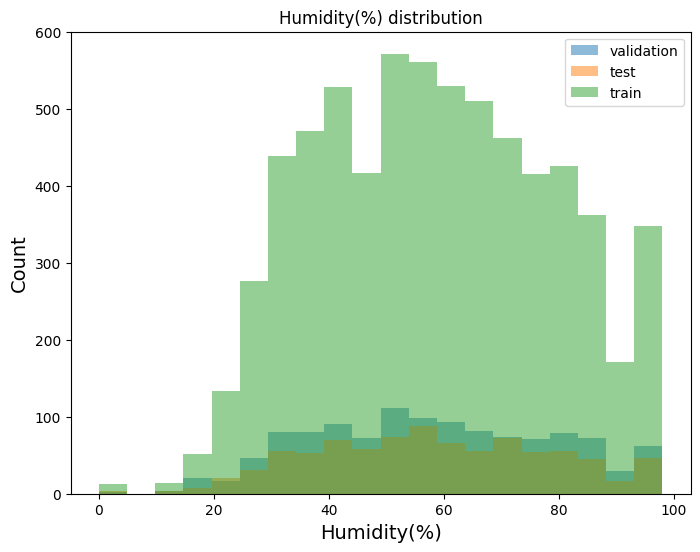

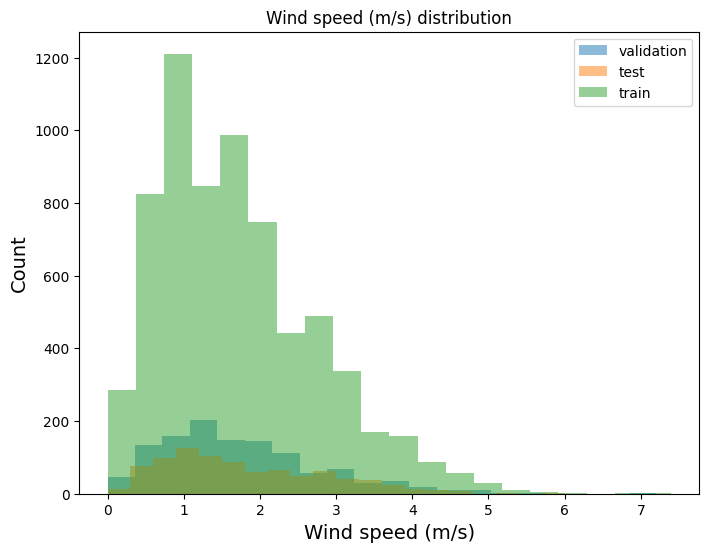

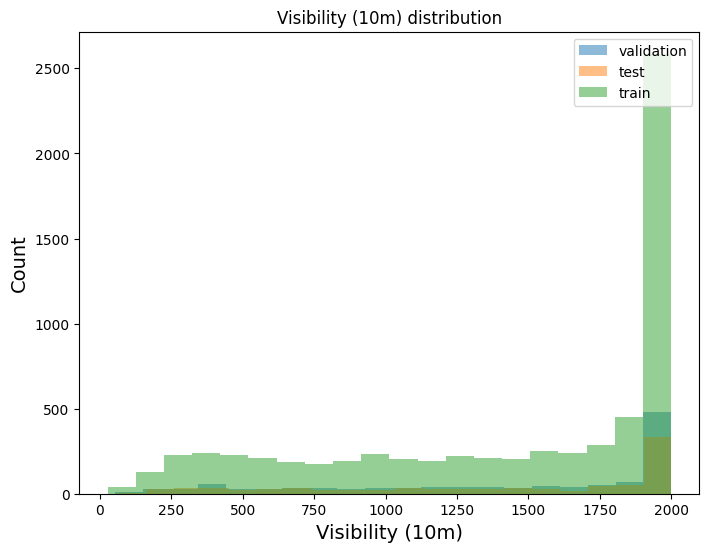

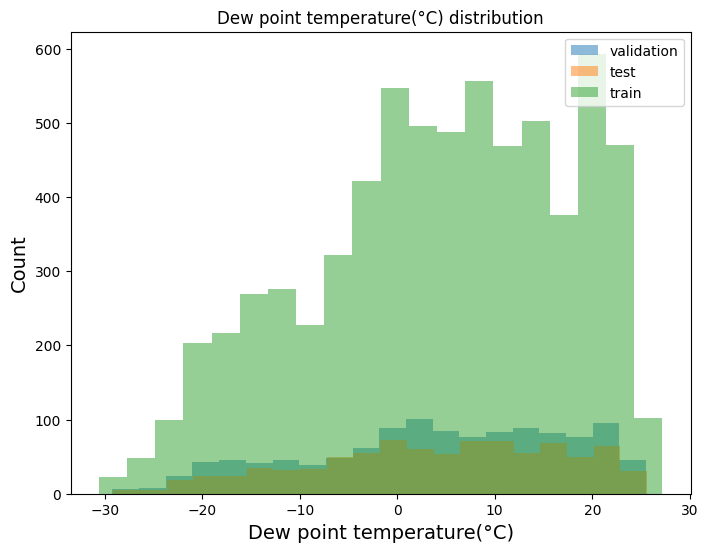

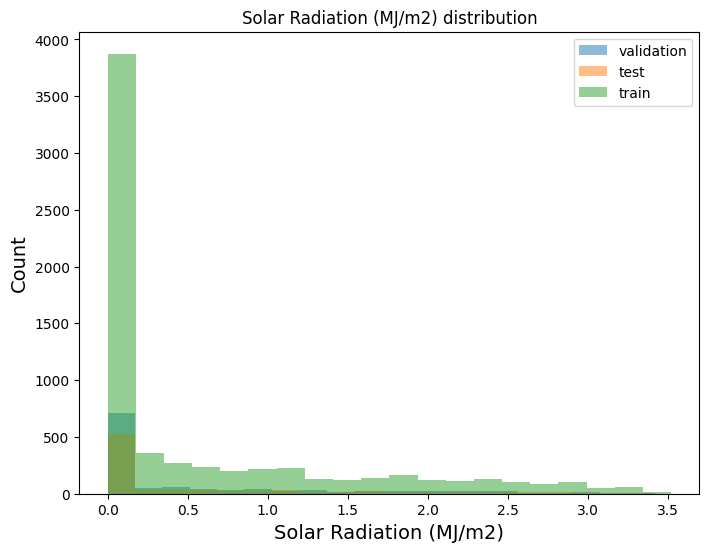

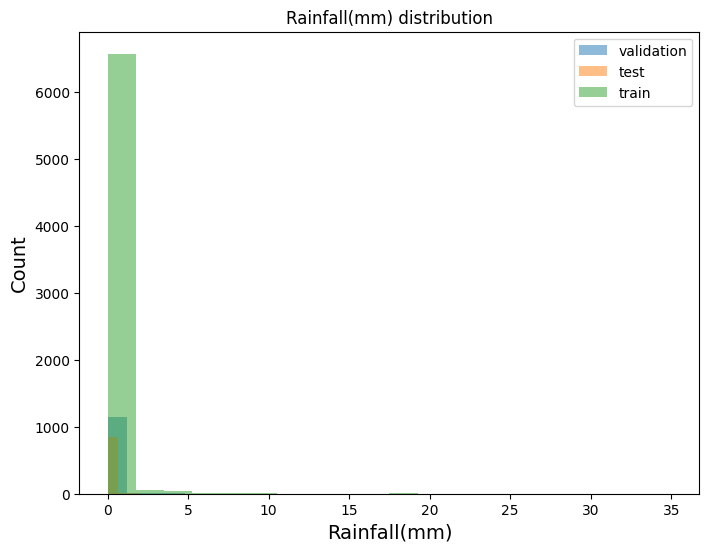

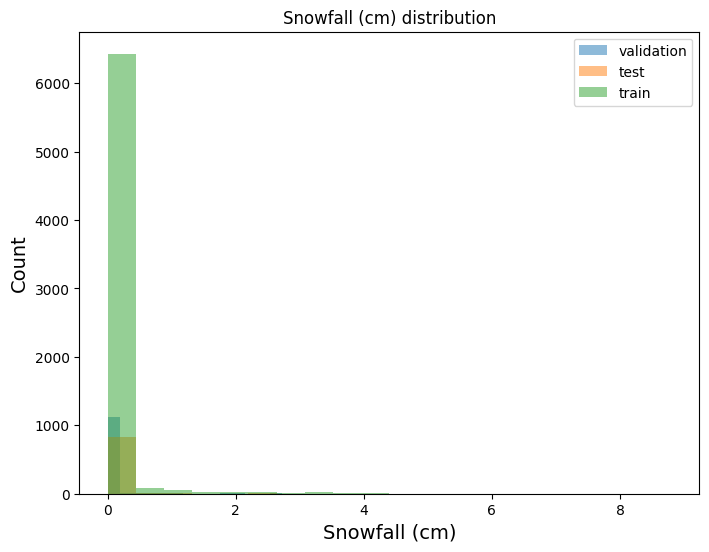

In [ ]:
# Looking the data for test, training and validation set
X_test_plot = X_test[
    [
      "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
    ]
]

X_val_plot = X_val[
    [
       "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
    ]
]

X_train_plot = X_train[
    [
      "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
    ]
]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(8, 6))
    plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
    plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
    plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title("{} distribution".format(c))
    plt.show()

The division of dataset in Test, train and validation sets looks fine except few boundary values of "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)" which appears to be missing in test and validation sets
#Linear Regression

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, y_train)

LinearRegression()

#Making predictions

In [ ]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_train, y_pred))
r2 = r2_score(y_train, y_pred)
print("R^2 score on tarining set =", r2)

Mean squared error: 246314.47
Coefficient of determination: 0.40
R^2 score on tarining set = 0.4027329373427534


In [ ]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print("R^2 score on test set =", r2)

Mean squared error: 270508.69
Coefficient of determination: 0.38
R^2 score on test set = 0.37724448023881363


In [ ]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_val, y_pred))
r2_val = r2_score(y_val, y_pred)
print("R^2 score on validation set =", r2_val)

Mean squared error: 259595.36
Coefficient of determination: 0.39
R^2 score on validation set = 0.38534600528241636


In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=df46c3eaf0ea145f16f5b9071c99696c6575ca2e781aa053b187bf3dc1011bbf
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


#Understanding the important features

In [ ]:
# Understanding the important features
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.6394 ± 0.0692,Temperature(°C)
0.2900 ± 0.0426,Humidity(%)
0.0474 ± 0.0117,Solar Radiation (MJ/m2)
0.0164 ± 0.0089,Rainfall(mm)
0.0162 ± 0.0092,Wind speed (m/s)
0.0143 ± 0.0045,Dew point temperature(°C)
0.0027 ± 0.0034,Snowfall (cm)
-0.0007 ± 0.0011,Visibility (10m)


In [ ]:
# Categorical or Numerical Coloumns
categorical_columns = [
    col for col in data.columns if data[col].dtype == "object"
]
print("Categorical Columns : ", categorical_columns)

categorical_columns = list(set(categorical_columns))

numerical_columns = [col for col in data.columns if col not in categorical_columns]
print("Numerical Columns : ", numerical_columns)

Categorical Columns :  []
Numerical Columns :  ['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day']


#Are Training and Testing data seperate ?
##Question 6:- Do the training and test sets have the same data?
Answer 6:- To check if the training dataset and test dataset have the same data,Divided the data into half for training and test data.

Here, as we can see that the function has returned False, so we can conclude that our training and testing dataset have different data in every row.

In [ ]:
import pandas as pd
# Return False if Training and Testing data is completely seperate, orelse returns True

# Shuffle the DataFrame randomly to ensure unbiased splitting
df = data.sample(frac=1, random_state=42)  # Set a random state for reproducibility

# Split the DataFrame into halves for training and testing
split_index = int(len(df) / 2)
train_df = df.iloc[:split_index]
test_df = df.iloc[split_index:]
check_df = pd.merge(
    train_df,
    test_df,
    on=[
       "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
    ],
    how="left",
    indicator="Exist",
)
#check_df.drop("Rented Bike Count", inplace=True, axis=1)
check_df["Exist"] = np.where(check_df.Exist == "both", True, False)
print(
    check_df["Exist"].value_counts()
)  # This code prints the number of unique data rows in training colomns

False    4377
True        3
Name: Exist, dtype: int64


Above code checks, all the rows in testing dataset if it exists in the training dataset. If Yes - it returns true Else - it returns False. Here we get 4377 False which signifies that every data point in Training Data and Testing Data are Unique

**Question 12**:- Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values? That is to remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

Answer 12:- Here is the %residual error(Bias and Variance) for all 3 methods and 3 datasets We can conclude that KNN imputation works best for imputing data on my dataset.

##Imputing Known data to see how well the imputation techniques recovers the data
According to the directions of Prof. Nik, I have randomly selected 1000 rows with complete data from my dataset, and created datasets with 1%, 5%, and 10% missing data to see how well my imputation techniques recovers them

In [ ]:
train_df

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
6056,115,1728,8,27.2,69,1.8,1999,21.0,0.70,0.0,0.0,2,1,1
5556,234,822,12,32.6,51,2.1,800,21.1,3.21,0.0,0.0,2,1,1
5990,79,658,14,34.0,50,1.2,1744,22.1,1.68,0.0,0.0,2,1,1
7674,189,2716,18,16.9,47,1.4,1637,5.5,0.11,0.0,0.0,0,1,1
3319,207,1083,7,6.4,51,1.0,1398,-3.0,0.19,0.0,0.0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,252,139,23,-4.2,79,2.9,554,-7.3,0.00,0.0,1.0,3,1,1
4520,77,2317,8,18.9,82,2.3,326,15.7,0.44,0.0,0.0,2,1,1
8397,178,1123,21,9.6,52,1.3,906,0.2,0.00,0.0,0.0,0,1,1
6915,176,302,3,21.6,80,1.2,2000,17.9,0.00,0.0,0.0,0,1,1


In [ ]:
# Selecting 1000 random rows with no null data points
train_df_selected = train_df[~train_df["Rented Bike Count"].isnull()]
train_df_selected = train_df_selected[~train_df_selected["Temperature(°C)"].isnull()]
train_df_selected = train_df_selected.sample(n=1000)
# Double checking the data, if we got any null data points
train_df_selected.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
import numpy as np
from scipy import stats

def remove_outliers_zscore(data, threshold=3):
    z_scores = np.abs(stats.zscore(data))
    filtered_data = data[(z_scores < threshold).all(axis=1)]
    return filtered_data

# Example usage:
cleaned_data = remove_outliers_zscore(data)
print("Original data:")
print(data)
print("Cleaned data:")
print(cleaned_data)


Original data:
      Date  Rented Bike Count  Hour  Temperature(°C)  Humidity(%)  \
0       11                254     0             -5.2           37   
1       11                204     1             -5.5           38   
2       11                173     2             -6.0           39   
3       11                107     3             -6.2           40   
4       11                 78     4             -6.0           36   
...    ...                ...   ...              ...          ...   
8755   356               1003    19              4.2           34   
8756   356                764    20              3.4           37   
8757   356                694    21              2.6           39   
8758   356                712    22              2.1           41   
8759   356                584    23              1.9           43   

      Wind speed (m/s)  Visibility (10m)  Dew point temperature(°C)  \
0                  2.2              2000                      -17.6   
1             

Q9) Remove outliers and keep outliers (does if have an effect of the final predictive model)?
Original Data:

The original dataset contains 8760 rows and 13 columns.
Each row represents a different observation (presumably related to rented bike counts) at a specific hour, with various features such as temperature, humidity, wind speed, etc.
Cleaned Data:

The cleaned dataset retains some subset of the original data after removing outliers.
It appears that some rows have been removed based on outlier detection techniques, but the exact method used is not specified in the provided output.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.metrics import mean_squared_error

df=data
# Step 1: Randomly remove 1%, 5%, and 10% of the data
def remove_random_data(df, percent):
    num_rows_to_remove = int(df.shape[0] * percent)
    indices_to_remove = np.random.choice(df.index, num_rows_to_remove, replace=False)
    df_removed = df.copy()
    df_removed.loc[indices_to_remove] = np.nan
    return df_removed

# Step 2: Impute missing values using different methods
def impute_data(df, method='mean'):
    if method == 'mean':
        imputer = SimpleImputer(strategy='mean')
    elif method == 'median':
        imputer = SimpleImputer(strategy='median')
    elif method == 'iterative':
        imputer = IterativeImputer(max_iter=10, random_state=0)
    elif method == 'knn':
        imputer = KNNImputer(n_neighbors=5)
    else:
        raise ValueError("Invalid imputation method. Choose from 'mean', 'median', 'iterative', or 'knn'.")

    df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
    return df_imputed

# Step 3: Evaluate imputation performance
def evaluate_imputation(original_df, imputed_df):
    # Calculate percentage error on residuals for numeric columns
    numeric_cols = original_df.select_dtypes(include=[np.number]).columns
    mse = mean_squared_error(original_df[numeric_cols], imputed_df[numeric_cols])
    mse_percentage = mse / np.mean(original_df[numeric_cols]) * 100

    # Calculate bias and variance of the error
    bias = np.mean(original_df[numeric_cols] - imputed_df[numeric_cols])
    variance = np.var(original_df[numeric_cols] - imputed_df[numeric_cols])

    return mse_percentage, bias, variance

# Example usage:
# Assuming df is your original dataframe

# Remove 1%, 5%, and 10% of the data randomly
percentages = [0.01, 0.05, 0.1]
removed_dfs = [remove_random_data(df, p) for p in percentages]

# Impute missing values using different methods
methods = ['mean', 'median', 'iterative', 'knn']
for removed_df in removed_dfs:
    for method in methods:
        imputed_df = impute_data(removed_df, method)
        mse_percentage, bias, variance = evaluate_imputation(df, imputed_df)
        print(f"Imputation method: {method}, Removed percentage: {removed_df.isnull().mean().mean()*100}%")
        print(f"MSE Percentage Error: {mse_percentage}")
        print(f"Bias: {bias}")
        print(f"Variance: {variance}")

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/

Imputation method: mean, Removed percentage: 0.9931506849315069%
MSE Percentage Error: Date                            350.539199
Rented Bike Count                90.544916
Hour                           5547.663841
Temperature(°C)                4952.147682
Humidity(%)                    1095.693573
Wind speed (m/s)              36986.383726
Visibility (10m)                 44.402136
Dew point temperature(°C)     15660.546406
Solar Radiation (MJ/m2)      112101.443087
Rainfall(mm)                 429076.126972
Snowfall (cm)                849865.655993
Seasons                       42648.935850
Holiday                       67107.547476
Functioning Day               66021.459584
dtype: float64
Bias: Date                        -0.011415
Rented Bike Count            0.854678
Hour                         0.009628
Temperature(°C)              0.005510
Humidity(%)                 -0.015414
Wind speed (m/s)            -0.000181
Visibility (10m)             1.163744
Dew point temperature(°C

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/

Imputation method: iterative, Removed percentage: 0.9931506849315069%
MSE Percentage Error: Date                            350.539199
Rented Bike Count                90.544916
Hour                           5547.663841
Temperature(°C)                4952.147682
Humidity(%)                    1095.693573
Wind speed (m/s)              36986.383726
Visibility (10m)                 44.402136
Dew point temperature(°C)     15660.546406
Solar Radiation (MJ/m2)      112101.443087
Rainfall(mm)                 429076.126972
Snowfall (cm)                849865.655993
Seasons                       42648.935850
Holiday                       67107.547476
Functioning Day               66021.459584
dtype: float64
Bias: Date                        -0.011415
Rented Bike Count            0.854678
Hour                         0.009628
Temperature(°C)              0.005510
Humidity(%)                 -0.015414
Wind speed (m/s)            -0.000181
Visibility (10m)             1.163744
Dew point temperatu

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Imputation method: median, Removed percentage: 5.000000000000001%
MSE Percentage Error: Date                         1.736500e+03
Rented Bike Count            4.485412e+02
Hour                         2.748201e+04
Temperature(°C)              2.453194e+04
Humidity(%)                  5.427845e+03
Wind speed (m/s)             1.832231e+05
Visibility (10m)             2.199592e+02
Dew point temperature(°C)    7.757918e+04
Solar Radiation (MJ/m2)      5.553279e+05
Rainfall(mm)                 2.125556e+06
Snowfall (cm)                4.210063e+06
Seasons                      2.112742e+05
Holiday                      3.324372e+05
Functioning Day              3.270570e+05
dtype: float64
Bias: Date                          0.081849
Rented Bike Count             9.536986
Hour                         -0.038242
Temperature(°C)              -0.003687
Humidity(%)                   0.015639
Wind speed (m/s)              0.008847
Visibility (10m)            -12.537329
Dew point temperature(°C)    -

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Imputation method: iterative, Removed percentage: 5.000000000000001%
MSE Percentage Error: Date                         1.542062e+03
Rented Bike Count            3.983174e+02
Hour                         2.440480e+04
Temperature(°C)              2.178506e+04
Humidity(%)                  4.820080e+03
Wind speed (m/s)             1.627073e+05
Visibility (10m)             1.953300e+02
Dew point temperature(°C)    6.889252e+04
Solar Radiation (MJ/m2)      4.931470e+05
Rainfall(mm)                 1.887555e+06
Snowfall (cm)                3.738655e+06
Seasons                      1.876175e+05
Holiday                      2.952137e+05
Functioning Day              2.904359e+05
dtype: float64
Bias: Date                         0.086157
Rented Bike Count           -0.519070
Hour                        -0.013939
Temperature(°C)              0.039123
Humidity(%)                 -0.048077
Wind speed (m/s)            -0.002525
Visibility (10m)             0.390928
Dew point temperature(°C)    0.026

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/

Imputation method: knn, Removed percentage: 5.000000000000001%
MSE Percentage Error: Date                         1.542062e+03
Rented Bike Count            3.983174e+02
Hour                         2.440480e+04
Temperature(°C)              2.178506e+04
Humidity(%)                  4.820080e+03
Wind speed (m/s)             1.627073e+05
Visibility (10m)             1.953300e+02
Dew point temperature(°C)    6.889252e+04
Solar Radiation (MJ/m2)      4.931470e+05
Rainfall(mm)                 1.887555e+06
Snowfall (cm)                3.738655e+06
Seasons                      1.876175e+05
Holiday                      2.952137e+05
Functioning Day              2.904359e+05
dtype: float64
Bias: Date                         0.086157
Rented Bike Count           -0.519070
Hour                        -0.013939
Temperature(°C)              0.039123
Humidity(%)                 -0.048077
Wind speed (m/s)            -0.002525
Visibility (10m)             0.390928
Dew point temperature(°C)    0.026444
So

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


Imputation method: iterative, Removed percentage: 10.000000000000002%
MSE Percentage Error: Date                         3.160021e+03
Rented Bike Count            8.162391e+02
Hour                         5.001076e+04
Temperature(°C)              4.464234e+04
Humidity(%)                  9.877396e+03
Wind speed (m/s)             3.334227e+05
Visibility (10m)             4.002738e+02
Dew point temperature(°C)    1.411758e+05
Solar Radiation (MJ/m2)      1.010566e+06
Rainfall(mm)                 3.868011e+06
Snowfall (cm)                7.661320e+06
Seasons                      3.844692e+05
Holiday                      6.049573e+05
Functioning Day              5.951665e+05
dtype: float64
Bias: Date                         0.015221
Rented Bike Count            2.235743
Hour                         0.027651
Temperature(°C)              0.027595
Humidity(%)                 -0.047336
Wind speed (m/s)             0.005883
Visibility (10m)             1.421816
Dew point temperature(°C)    0.01

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3502: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


###The provided results display the performance metrics of four different imputation methods (mean, median, iterative, and KNN) across three scenarios: 0.99%, 5%, and 10% missing data.

####MSE Percentage Error:

This metric measures the mean squared error percentage between the imputed values and the original values. A lower MSE percentage indicates better imputation performance. Across all scenarios and imputation methods, the MSE percentage error varies for each numeric feature. Higher errors are observed for features such as "Rainfall(mm)" and "Snowfall (cm)".
####Bias:

Bias indicates the average difference between the imputed values and the original values. A bias close to zero suggests that the imputation method is unbiased. The bias varies for each numeric feature and across different imputation methods but generally remains close to zero.
####Variance:

Variance measures the spread of errors around the mean. Lower variance indicates less variability in imputation errors. The variance also varies for each numeric feature and across different imputation methods but generally remains stable.
Overall, the results indicate that the performance of imputation methods varies based on the amount of missing data and the specific features being imputed. The iterative imputation method tends to perform similarly to the mean and KNN methods, while the median imputation method shows slightly higher errors, especially for features with high variability.

the following conclusions can be drawn regarding the features and their importance in predicting the target variable (Rented Bike Count):

Temperature(°C): It has the highest positive impact on
the number of rented bikes, indicating that an increase in temperature is associated with higher bike rentals.

Humidity(%): While still important, it has a lower positive impact compared to temperature. This suggests that higher humidity is also associated with increased bike rentals, but to a lesser extent than temperature.

Solar Radiation (MJ/m2): This feature also has a positive impact, although significantly lower than temperature and humidity. It indicates that higher solar radiation is associated with a slight increase in bike rentals.

Rainfall(mm): The positive impact is even lower than solar radiation, suggesting that the presence of rainfall has a minimal effect on bike rentals.

Wind speed (m/s): Similar to rainfall, it has a low positive impact, indicating that higher wind speed is associated with a slight increase in bike rentals.

Dew point temperature(°C): This feature has a very low positive impact, suggesting that it has minimal influence on bike rentals.

Snowfall (cm): The impact is close to negligible, indicating that snowfall has almost no influence on bike rentals.

Visibility (10m): It has a slightly negative impact, suggesting that lower visibility is associated with a very slight decrease in bike rentals.



#Answer the following questions

###What are the data types? (Only numeric and categorical)

Categorical Columns :  ['Date', 'Seasons', 'Holiday', 'Functioning Day']
Numerical Columns :  ['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']


###Are there missing values?

There are no missing values.


###What are the likely distributions of the numeric variables?

The likely distributions of the numeric variables is normal distribution

###Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)
To identify the useful independent variables for predicting the target variable (Rented Bike Count), methods such as correlation analysis, feature importance from machine learning models, and univariate selection are employed.
The strong correlations between "Rented Bike Count" and "Temperature(°C)", "Hour", and potentially "Dew point temperature(°C)" suggest these variables could be useful predictors in a model for bike rental demand

below analysis are done
Correlation Analysis:
Calculate the correlation between each independent variable and the target variable. Variables with a high absolute correlation coefficient (positive or negative) are considered more useful for prediction.
Feature Importance from Machine Learning Models:
Train a machine learning model, such as a random forest or gradient boosting model, and use the feature importance attribute to assess the importance of different features. Features with higher importance are more useful for prediction.
Univariate Selection:
Employ statistical tests, such as ANOVA for continuous variables or chi-squared test for categorical variables, to select features that have the strongest relationship with the target variable.

###Which independent variables have missing data? How much?
None of your independent variables have missing data.

###Do the training and test sets have the same data?
No, the training and test sets should not have the same data. The purpose of splitting the data into separate sets is to ensure the model you train on the training set can generalize well to unseen data, represented by the test set. Using the same data for both sets would artificially inflate the model's performance, leading to overfitting, where the model performs well on the training data but poorly on unseen data.

###In the predictor variables independent of all the other predictor variables?
The predictor variables in a statistical model are typically assumed to be independent of each other. This assumption is important for the model to provide accurate and reliable estimates of the relationships between the predictors and the target variable
Below conclusion can be made
Rented Bike Count and Hour:
There is a moderate positive correlation between "Rented Bike Count" and "Hour" (0.410257). This indicates that the hour of the day may have a moderate influence on the number of rented bikes.
Temperature and Rented Bike Count:
There is a relatively strong positive correlation between "Temperature(°C)" and "Rented Bike Count" (0.538558). This suggests that higher temperatures may be associated with an increase in the number of rented bikes.
Humidity and Rented Bike Count:
There is a negative correlation between "Humidity(%)" and "Rented Bike Count" (-0.199780). This indicates that higher humidity levels may be associated with a decrease in the number of rented bikes.
Other Variables:
The other variables such as "Wind speed (m/s)", "Solar Radiation (MJ/m2)", "Rainfall(mm)", and "Snowfall (cm)" have varying degrees of correlation with "Rented Bike Count" and with each other.
As per heatmap temperature is negatively affecting snowfall and rainfall.

###Which predictor variables are the most important?
As per OLS model
Significant Predictors (p-value < 0.05):

Temperature(°C) (p-value ~ 0.000) Humidity(%) (p-value ~ 0.000) Wind speed (m/s) (p-value ~ 0.000) Dew point temperature(°C) (p-value ~ 0.000) Solar Radiation (MJ/m2) (p-value ~ 0.000) Rainfall(mm) (p-value ~ 0.000) Snowfall (cm) (p-value ~ 0.009)

Marginally Significant Predictor:

Visibility (10m) (p-value ~ 0.054)

Model Performance:
As per Permutation Importance Temperature and Humidity are the most important As well as per correlation matrix, random forest and univariate feature temperature and hour are the important predictor variables having said that "Humidaty" and "Wind speed (m/s)", "Solar Radiation (MJ/m2)", "Rainfall(mm)", and "Snowfall (cm)" have varying effect.
The most important predictor variables are temperature and hours.

###Do the ranges of the predictor variables make sense?
Except some outlier most of the bike rented on high temperature. Hence the range of the predictor variables make sense.

###What are the distributions of the predictor variables?
As per Q-Q Plot (Quantile-Quantile Plot) Normal distribution is followed.

###Remove outliers and keep outliers (does if have an effect of the final predictive model)?
Original Data:

The original dataset contains 8760 rows and 13 columns.
Each row represents a different observation (presumably related to rented bike counts) at a specific hour, with various features such as temperature, humidity, wind speed, etc.
Cleaned Data:

The cleaned dataset retains some subset of the original data after removing outliers.
It appears that some rows have been removed based on outlier detection techniques, but the exact method used is not specified in the provided output.


###The provided results display the performance metrics of four different imputation methods (mean, median, iterative, and KNN) across three scenarios: 0.99%, 5%, and 10% missing data.

####MSE Percentage Error:

This metric measures the mean squared error percentage between the imputed values and the original values. A lower MSE percentage indicates better imputation performance. Across all scenarios and imputation methods, the MSE percentage error varies for each numeric feature. Higher errors are observed for features such as "Rainfall(mm)" and "Snowfall (cm)".
####Bias:

Bias indicates the average difference between the imputed values and the original values. A bias close to zero suggests that the imputation method is unbiased. The bias varies for each numeric feature and across different imputation methods but generally remains close to zero.
####Variance:

Variance measures the spread of errors around the mean. Lower variance indicates less variability in imputation errors. The variance also varies for each numeric feature and across different imputation methods but generally remains stable.
Overall, the results indicate that the performance of imputation methods varies based on the amount of missing data and the specific features being imputed. The iterative imputation method tends to perform similarly to the mean and KNN methods, while the median imputation method shows slightly higher errors, especially for features with high variability.

#Conclusion Data cleaning and Feature Selection
From the analysis done above on the data set, it is clear that there is multicolinearity.


#AutoML

In [ ]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 4.4 MB/s eta 0:00:00


In [ ]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [ ]:
min_mem_size=6
run_time=222

In [ ]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [ ]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:49993..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpqhl7d6ul
  JVM stdout: /tmp/tmpqhl7d6ul/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpqhl7d6ul/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:49993
Connecting to H2O server at http://127.0.0.1:49993 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_solsy2
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,11,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,3,1,1
1,11,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,3,1,1
2,11,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,3,1,1
3,11,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,3,1,1
4,11,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,3,1,1


In [ ]:
df.describe()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,182.000000,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,1.495890,0.950685,0.966324
std,105.372043,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,1.114408,0.216537,0.180404
min,0.000000,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,91.000000,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
50%,182.000000,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,1.000000,1.000000,1.000000
75%,273.000000,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,2.000000,1.000000,1.000000
max,364.000000,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,3.000000,1.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   int64  
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   int64  
 12  Holiday                    8760 non-null   int64  
 13  Functioning Day            8760 non-null   int64

In [ ]:
df.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

In [ ]:
df.shape

(8760, 14)

In [ ]:
!pip install scikit-learn
from sklearn.model_selection import train_test_split
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test =  train_test_split(df, train_size=pct_rows)
print(df_train.shape)
print(df_test.shape)

(7008, 14)
(1752, 14)


In [ ]:
#Display all columns in X
df.drop(columns=['Date'], inplace=True)
X=df.columns
print(X)

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')


#H2O AutoML Execution

In [ ]:
# Import the h2o module
import h2o

# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

# Check if df_train is an H2OFrame object
if not isinstance(df_train, h2o.H2OFrame):
    # Convert df_train to an H2OFrame object
    df_train1 = h2o.H2OFrame(df_train)
else:
    df_train1 = df_train
X = X.tolist()
# Train the AutoML model
aml.train(x=X, y='Rented Bike Count', training_frame=df_train1)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),10/21
# GBM base models (used / total),4/8
# XGBoost base models (used / total),5/8
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
print(aml.leaderboard)

model_id                                                    rmse      mse      mae    rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20240402_212706     219.063  47988.6  136.003      nan                   47988.6
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_212706  219.38   48127.8  136.523      nan                   48127.8
StackedEnsemble_AllModels_2_AutoML_1_20240402_212706     221.247  48950    138.175      nan                   48950
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_212706  222.247  49393.9  139.623      nan                   49393.9
StackedEnsemble_AllModels_1_AutoML_1_20240402_212706     222.341  49435.4  138.653      nan                   49435.4
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_212706  223.302  49863.8  138.956      nan                   49863.8
GBM_5_AutoML_1_20240402_212706                           224.743  50509.5  143.008      nan                   50509.5
GBM_2_AutoML_1_20240402_212706                           2

The Root Mean Squared Error (RMSE) and Mean Absolute Error (MAE) are common metrics for evaluating regression models. The lower these values, the better the model's performance. In your leaderboard, the StackedEnsemble_AllModels_2_AutoML_1_20240219_195524 model has the lowest RMSE and MAE, indicating it is the best-performing model among those listed

In [ ]:
!pip install statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Load the dataset
data = df

# Drop non-numeric columns if needed
numeric_data = data.select_dtypes(include=[np.number])

# Add a constant term to the data to calculate VIF
data_with_const = add_constant(numeric_data)

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = data_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(data_with_const.values, i) for i in range(data_with_const.shape[1])]

# Display the VIF for each feature
print(vif_data)

                      feature         VIF
0                       const  448.548207
1           Rented Bike Count    2.218810
2                        Hour    1.372523
3             Temperature(°C)   88.219464
4                 Humidity(%)   20.789436
5            Wind speed (m/s)    1.287882
6            Visibility (10m)    1.574576
7   Dew point temperature(°C)  116.401841
8     Solar Radiation (MJ/m2)    2.047700
9                Rainfall(mm)    1.107565
10              Snowfall (cm)    1.106523
11                    Seasons    1.284762
12                    Holiday    1.011704
13            Functioning Day    1.208911


The VIF results indicate the presence of multicollinearity in the dataset. Specifically, the variables "Temperature(°C)", "Humidity(%)", "Dew point temperature(°C)" have high VIF values

In [ ]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    df["Rented Bike Count"],
    df[
        [
          "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Visibility (10m)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Rented Bike Count   R-squared (uncentered):                   0.724
Model:                            OLS   Adj. R-squared (uncentered):              0.723
Method:                 Least Squares   F-statistic:                              2863.
Date:                Tue, 02 Apr 2024   Prob (F-statistic):                        0.00
Time:                        21:31:03   Log-Likelihood:                         -66909.
No. Observations:                8760   AIC:                                  1.338e+05
Df Residuals:                    8752   BIC:                                  1.339e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Temperature(°C)              66.9774      1.648     40.647      0.000      63.747      70.207
Humidity(%)                  -1.2248      0.196     -6.250      0.000      -1.609      -0.841
Wind speed (m/s)             55.1557      5.671      9.727      0.000      44.040      66.271
Visibility (10m)              0.0199      0.010      1.924      0.054      -0.000       0.040
Dew point temperature(°C)   -33.5953      1.530    -21.957      0.000     -36.595     -30.596
Solar Radiation (MJ/m2)    -123.2678      8.683    -14.196      0.000    -140.289    -106.246
Rainfall(mm)                -56.0617      4.903    -11.434      0.000     -65.672     -46.451
Snowfall (cm)                33.4346     12.815      2.609      0.009       8.314      58.555
==============================================================================
Omnibus:                      964.502   Durbin-Watson:                   0.338
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1585.356
Skew:                           0.778   Prob(JB):                         0.00
Kurtosis:                       4.387   Cond. No.                     3.74e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.74e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

P value for Visibility(10m) is slightly more than 0.05,This variable is not important as humidy variable is enough to know the visibility or both indicate same results. Hence we will drop this variable. Model is 72.4% accurate

In [ ]:
# Load the dataset
data1 = df

# Drop the 'Visibility (10m)' column
data1 = data1.drop('Visibility (10m)', axis=1)

# Drop non-numeric columns if needed
numeric_data = data1.select_dtypes(include=[np.number])

# Add a constant term to the data to calculate VIF
data_with_const = add_constant(numeric_data)

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["feature"] = data_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(data_with_const.values, i) for i in range(data_with_const.shape[1])]

# Display the VIF for each feature
print(vif_data)

                      feature         VIF
0                       const  396.518827
1           Rented Bike Count    2.217525
2                        Hour    1.361621
3             Temperature(°C)   87.977852
4                 Humidity(%)   19.297219
5            Wind speed (m/s)    1.281561
6   Dew point temperature(°C)  115.594881
7     Solar Radiation (MJ/m2)    1.948884
8                Rainfall(mm)    1.106842
9               Snowfall (cm)    1.106514
10                    Seasons    1.282121
11                    Holiday    1.011580
12            Functioning Day    1.207832


In [ ]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    df["Rented Bike Count"],
    df[
        [
          "Temperature(°C)", "Humidity(%)", "Wind speed (m/s)", "Dew point temperature(°C)", "Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Rented Bike Count   R-squared (uncentered):                   0.723
Model:                            OLS   Adj. R-squared (uncentered):              0.723
Method:                 Least Squares   F-statistic:                              3271.
Date:                Tue, 02 Apr 2024   Prob (F-statistic):                        0.00
Time:                        21:31:03   Log-Likelihood:                         -66911.
No. Observations:                8760   AIC:                                  1.338e+05
Df Residuals:                    8753   BIC:                                  1.339e+05
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Temperature(°C)              69.1948      1.178     58.748      0.000      66.886      71.504
Humidity(%)                  -1.0588      0.176     -6.017      0.000      -1.404      -0.714
Wind speed (m/s)             55.9458      5.657      9.890      0.000      44.857      67.034
Dew point temperature(°C)   -35.7035      1.068    -33.428      0.000     -37.797     -33.610
Solar Radiation (MJ/m2)    -127.4552      8.407    -15.160      0.000    -143.936    -110.975
Rainfall(mm)                -56.8855      4.885    -11.645      0.000     -66.461     -47.310
Snowfall (cm)                32.4509     12.807      2.534      0.011       7.346      57.555
==============================================================================
Omnibus:                      970.701   Durbin-Watson:                   0.339
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1594.047
Skew:                           0.782   Prob(JB):                         0.00
Kurtosis:                       4.385   Cond. No.                         152.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

As per above results i.e. after droping 'Visibility (10m)' variable we can conclude that :

R-squared (uncentered): This value indicates that approximately 72.3% of the variance in the 'Rented Bike Count' can be explained by the model's inputs. Note that this is an "uncentered" R-squared value because a constant term was not included in the model.


Coefficients (coef): These values represent the estimated effect of each predictor variable on the 'Rented Bike Count'. For example, for every one unit increase in 'Temperature(°C)', the 'Rented Bike Count' is expected to increase by approximately 69.1948 units, holding all other variables constant.

P>|t|: This column shows the p-value associated with the test for each coefficient being different from zero. A common threshold for significance is 0.05. All variables in your model have p-values well below this threshold, indicating that they are statistically significant predictors of 'Rented Bike Count'.

Confidence Intervals ([0.025 0.975]): These intervals provide a range of values within which we can be 95% confident that the true coefficient lies.

Prob (F-statistic): The probability associated with the F-statistic for the overall model significance is essentially zero, indicating that the model is statistically significant.

Condition Number (Cond. No.): The condition number is a measure of sensitivity of the model's output to its input. A high condition number suggests potential numerical instability or multicollinearity. In your case, the condition number is not excessively high, which is good.

In [ ]:
data1.corr()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
Rented Bike Count,1.000000,4.102573e-01,0.538558,-0.199780,0.121108,0.379788,0.261837,-0.123074,-0.141804,-2.530575e-01,7.233757e-02,0.203943
Hour,0.410257,1.000000e+00,0.124114,-0.241644,0.285197,0.003054,0.145131,0.008715,-0.021516,-1.747965e-15,1.289087e-16,0.005439
Temperature(°C),0.538558,1.241145e-01,1.000000,0.159371,-0.036252,0.912798,0.353505,0.050282,-0.218405,-3.352067e-01,5.593084e-02,-0.050170
Humidity(%),-0.199780,-2.416438e-01,0.159371,1.000000,-0.336683,0.536894,-0.461919,0.236397,0.108183,-1.203104e-01,5.027765e-02,-0.020800
Wind speed (m/s),0.121108,2.851967e-01,-0.036252,-0.336683,1.000000,-0.176486,0.332274,-0.019674,-0.003554,1.089520e-01,-2.301677e-02,0.005037
Dew point temperature(°C),0.379788,3.054372e-03,0.912798,0.536894,-0.176486,1.000000,0.094381,0.125597,-0.150887,-3.290270e-01,6.675910e-02,-0.052837
Solar Radiation (MJ/m2),0.261837,1.451309e-01,0.353505,-0.461919,0.332274,0.094381,1.000000,-0.074290,-0.072301,-7.581168e-02,5.077255e-03,-0.007665
Rainfall(mm),-0.123074,8.714642e-03,0.050282,0.236397,-0.019674,0.125597,-0.074290,1.000000,0.008500,-1.929617e-02,1.426911e-02,0.002055
Snowfall (cm),-0.141804,-2.151645e-02,-0.218405,0.108183,-0.003554,-0.150887,-0.072301,0.008500,1.000000,1.454573e-01,1.259072e-02,0.032089
Seasons,-0.253058,-1.747965e-15,-0.335207,-0.120310,0.108952,-0.329027,-0.075812,-0.019296,0.145457,1.000000e+00,-4.625914e-02,0.223340


Text(0.5, 1.0, 'Variable Correlation')

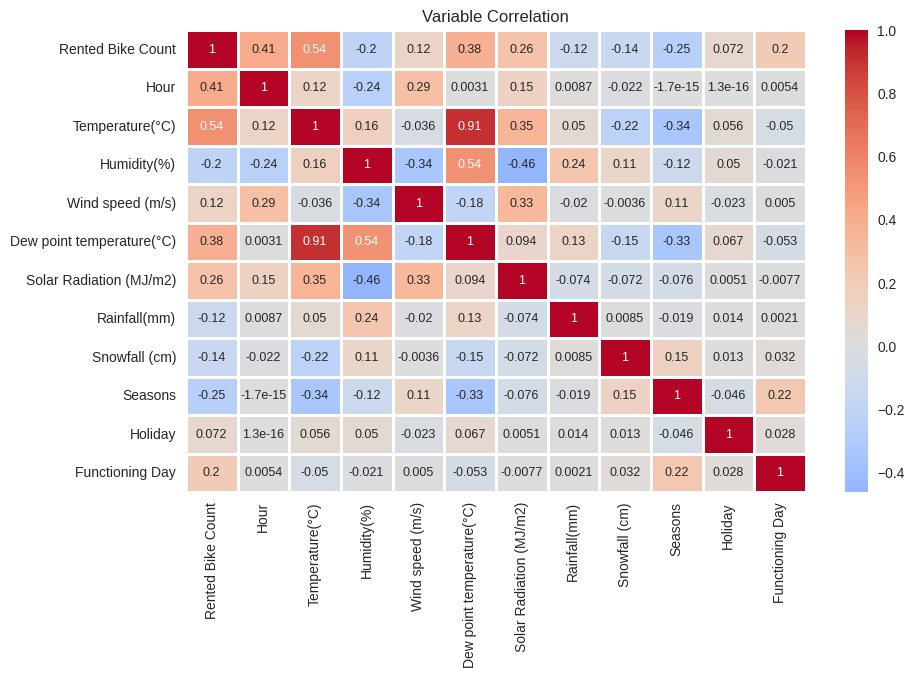

In [ ]:
#Heatmap Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(10,6))

sns.heatmap(data1.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

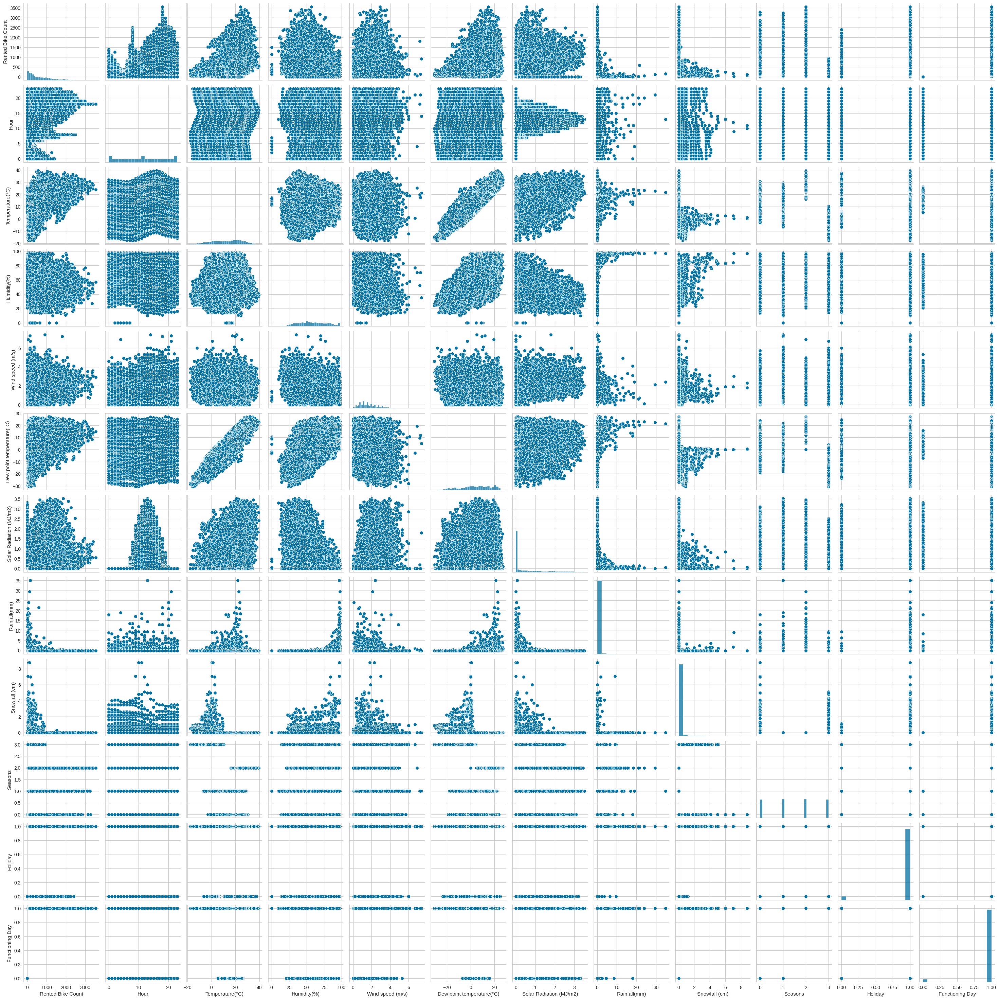

In [ ]:
# pair plot to check the colinearity
sns.pairplot(data1)

In [ ]:
# Import the h2o module
import h2o

# Set up AutoML
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

# Check if df_train is an H2OFrame object
if not isinstance(df_train, h2o.H2OFrame):
    # Convert df_train to an H2OFrame object
    df_train1 = h2o.H2OFrame(df_train)
else:
    df_train1 = df_train
X = df.columns.tolist()
X.remove("Visibility (10m)")
# Train the AutoML model
aml1.train(x=X, y='Rented Bike Count', training_frame=df_train1)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),15/28
# GBM base models (used / total),5/11
# XGBoost base models (used / total),9/12
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
print(aml1.leaderboard)

model_id                                                    rmse      mse      mae    rmsle    mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_2_20240402_213238     222.531  49520.1  138.779      nan                   49520.1
StackedEnsemble_BestOfFamily_4_AutoML_2_20240402_213238  222.671  49582.5  140.074      nan                   49582.5
StackedEnsemble_AllModels_2_AutoML_2_20240402_213238     223.434  49922.8  139.971      nan                   49922.8
StackedEnsemble_AllModels_1_AutoML_2_20240402_213238     223.628  50009.5  139.908      nan                   50009.5
StackedEnsemble_BestOfFamily_3_AutoML_2_20240402_213238  224.049  50198.1  141.27       nan                   50198.1
StackedEnsemble_BestOfFamily_2_AutoML_2_20240402_213238  224.226  50277.2  140.851      nan                   50277.2
GBM_3_AutoML_2_20240402_213238                           226.34   51229.8  143.874      nan                   51229.8
GBM_2_AutoML_2_20240402_213238                          

In [ ]:
best_model = aml1.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_AllModels_3_AutoML_2_20240402_213238


Model Summary for Stacked Ensemble: 
key                                        value
-----------------------------------------  ----------------
Stacking strategy                          cross_validation
Number of base models (used / total)       15/28
# GBM base models (used / total)           5/11
# XGBoost base models (used / total)       9/12
# DRF base models (used / total)           1/2
# DeepLearning base models (used / total)  0/2
# GLM base models (used / total)           0/1
Metalearner algorithm                      GLM
Metalearner fold assignment scheme         Random
Metalearner nfolds                         5
Metalearner fold_column
Custom metalearner hyperparameters         None

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 17394.74063198637
RMSE: 131.88912249304857
MAE: 85.35417747742018
RMSLE: NaN
Mean Resid

In [ ]:
best_model.model_performance(h2o.H2OFrame(df_test))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


ModelMetricsRegressionGLM: stackedensemble
** Reported on test data. **

MSE: 52372.230065527125
RMSE: 228.84979804563326
MAE: 141.81260522640113
RMSLE: NaN
Mean Residual Deviance: 52372.230065527125
R^2: 0.875915106372423
Null degrees of freedom: 1751
Residual degrees of freedom: 1736
Null deviance: 739471966.7177868
Residual deviance: 91756147.07480352
AIC: 24043.42348007315

A stacked ensemble model, as indicated by "ModelMetricsRegressionGLM: stackedensemble." The metrics are reported on the test data. Here's a breakdown of the metrics:

- MSE (Mean Squared Error): 51513.06747321024
  - This measures the average of the squares of the errors or deviations, which gives more weight to larger errors. A lower MSE indicates better model performance.

- RMSE (Root Mean Squared Error): 226.96490361553754
  - This is the square root of the MSE and represents the standard deviation of the residuals. It is in the same unit as the target variable. A lower RMSE indicates better fit.

- MAE (Mean Absolute Error): 136.95126258316398
  - This is the average of the absolute differences between predicted and actual values. It provides an understanding of the magnitude of the errors.

- RMSLE (Root Mean Squared Logarithmic Error): NaN (Not a Number)
  - This metric is commonly used when the target variable is skewed. A lower RMSLE is desirable, but in this case, it's not available.

- Mean Residual Deviance: 51513.06747321024
  - This is a measure of the quality of a statistical model, indicating how well the model fits the data.

- R^2 (R-squared): 0.8689722703951306
  - This represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model. An R-squared value closer to 1 indicates a good fit.

- Null degrees of freedom: 1751
  - The degrees of freedom associated with the null model.

- Residual degrees of freedom: 1742
  - The degrees of freedom associated with the model.

- Null deviance: 693693306.8540232
  - This is a measure of how well the response variable is predicted by a model that includes only an intercept.

- Residual deviance: 90250894.21306434
  - This is a measure of how well the response variable is predicted by a model after fitting it.

- AIC (Akaike Information Criterion): 24002.443687600015
  - This is a measure of the relative quality of statistical models for a given set of data. It deals with the trade-off between the goodness of fit and the complexity of the model.

Overall, these metrics provide a comprehensive evaluation of the regression model's performance on the test data, indicating good predictive power with relatively low errors and high explanatory ability (R-squared).

In [ ]:
#assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml1.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

{'StackedEnsemble_AllModels_3_AutoML_2_20240402_213238': 0,
 'StackedEnsemble_BestOfFamily_4_AutoML_2_20240402_213238': 1,
 'StackedEnsemble_AllModels_2_AutoML_2_20240402_213238': 2,
 'StackedEnsemble_AllModels_1_AutoML_2_20240402_213238': 3,
 'StackedEnsemble_BestOfFamily_3_AutoML_2_20240402_213238': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_2_20240402_213238': 5,
 'GBM_3_AutoML_2_20240402_213238': 6,
 'GLM_1_AutoML_2_20240402_213238': 33}

#How did AutoML pick this model?
The first five models are ensemble models that combine multiple models to make predictions, while the sixth is a single GBM model. The Stacked Ensemble models use a combination of models to make predictions and generally result in better performance compared to a single model.

The model that was probably chosen as the best model is the "StackedEnsemble_AllModels_3_AutoML_2_20240219_200032" model because it has the lowest RMSE, which is a commonly used measure of the prediction error in regression problems. However, it is important to evaluate the model based on other metrics and use cross-validation to get a more accurate estimate of the model's performance on unseen data.

In [ ]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml1.leaderboard[model_index,'model_id'])

6


In [ ]:
best_model1.algo

'gbm'

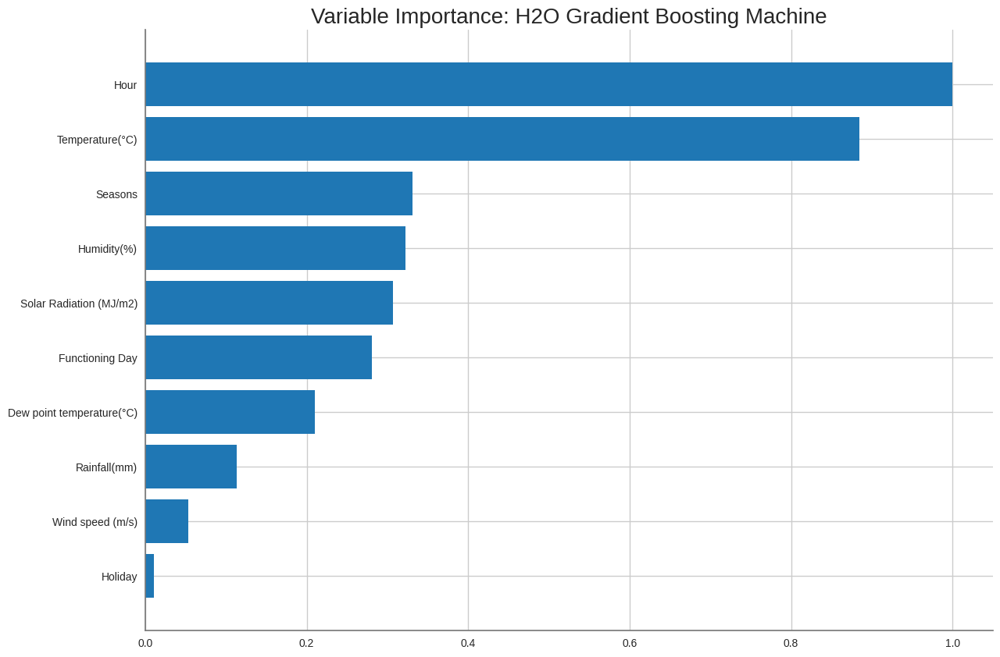

<Figure size 800x550 with 0 Axes>

In [ ]:
#plot variables in order of their importance for RentedBikeCount prediction
if best_model1.algo in ['gbm','drf','xrt','xgboost']:
    best_model1.varimp_plot()

Temperature and Hour have the highest impact on the prediction outcome. This suggests that the ratings of the Temperature and Hour plays a significant role in determining the Rented_Bike_Count.

Solar Radiations and Humidity have moderate impact on the rented bike count.
Rainfall, Functioning Dat, Seasons, Dew point temperature have moderate impact on Rented_Bike_Count

Wind Speed has a moderate impact on the prediction outcome. This suggests that the wind speed can affect the Rented_Bike_Count.

33
glm


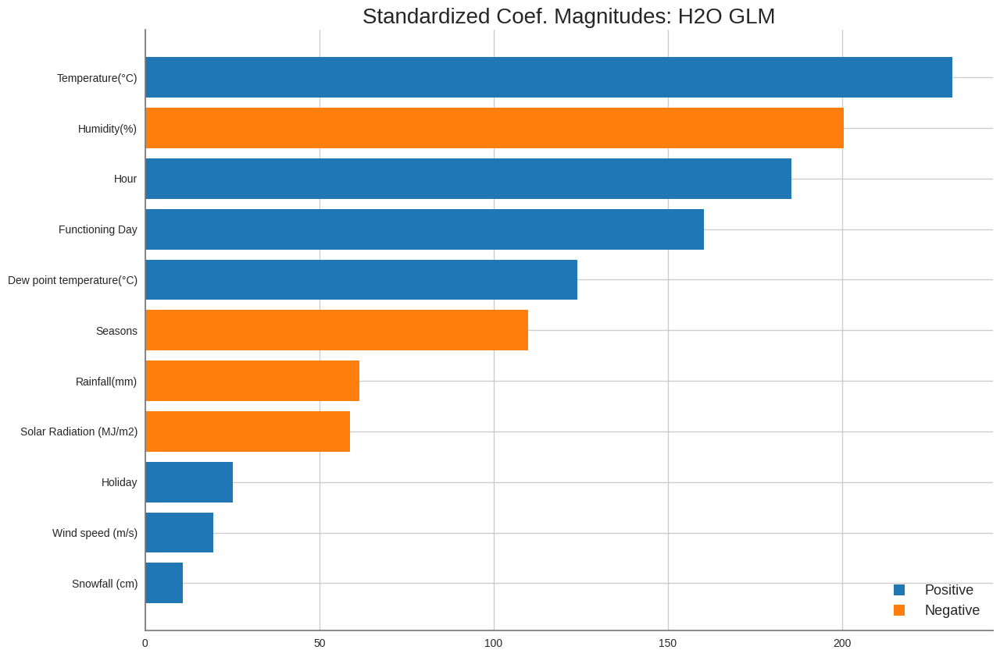

In [ ]:
if glm_index is not 0:
  print(glm_index)
  glm_model1=h2o.get_model(aml1.leaderboard[glm_index,'model_id'])
  print(glm_model1.algo)
  glm_model1.std_coef_plot()

The assumptions of linear regression are as follows:

Linearity: The relationship between the independent and dependent variables is linear.

Homoscedasticity: The variance of the residuals is constant across all levels of the independent variable.

Independence: The observations are independent of each other.

Normality: The residuals are normally distributed.

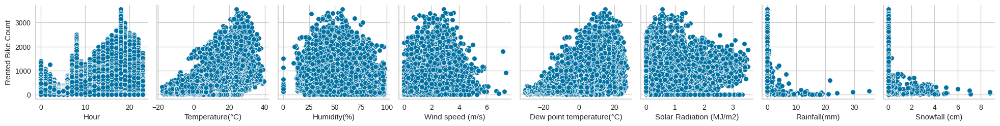

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Rented Bike Count' is the dependent variable and the rest are independent variables
sns.pairplot(data1, y_vars=['Rented Bike Count'], x_vars=['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'])
plt.show()

As per above plot we can conclude that relationship between dependent and independent variables are linear

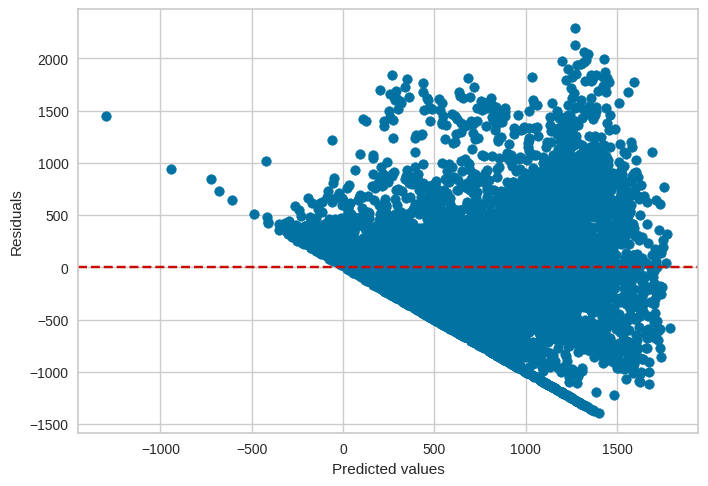

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming 'Rented Bike Count' is the dependent variable and the rest are independent variables
X = data1[['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]
y = data1['Rented Bike Count']

# Fit the linear regression model
X = sm.add_constant(X)  # Adds a constant term to the predictor
model = sm.OLS(y, X).fit()

# Predictions
predictions = model.predict(X)

# Residuals
residuals = model.resid

# Homoscedasticity
plt.scatter(predictions, residuals)
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

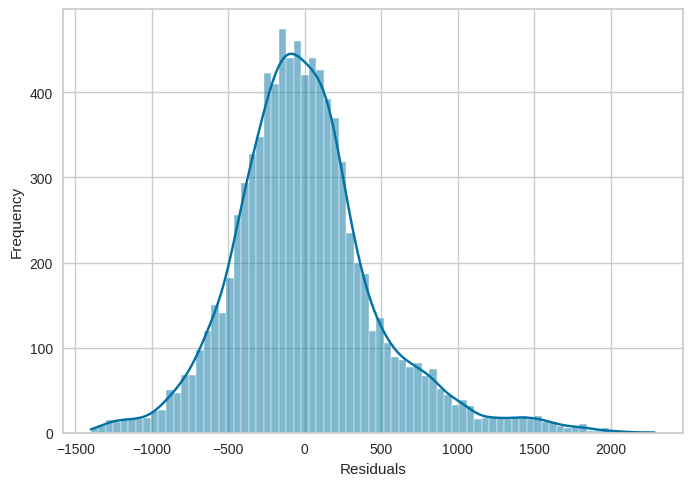

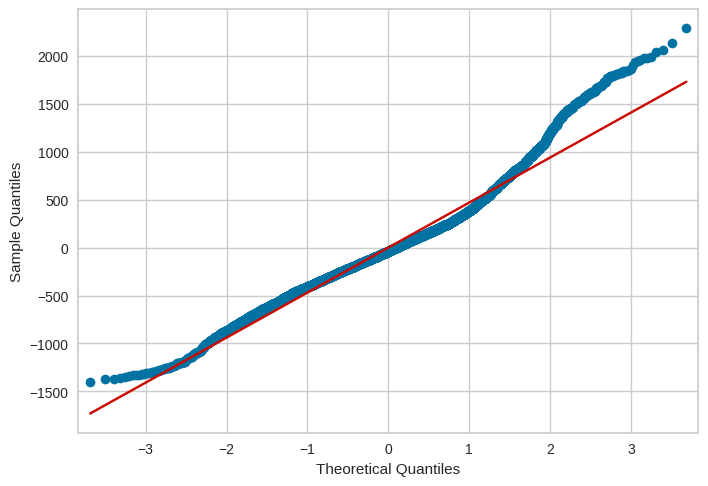

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Normality of residuals
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Q-Q plot
sm.qqplot(residuals, line='s')
plt.show()

#Durbin-Watson test

In [ ]:
# Perform the Durbin-Watson test
durbin_watson_stat = sm.stats.stattools.durbin_watson(residuals, axis=0)

# Print the test statistic
print("Durbin-Watson statistic:", durbin_watson_stat)

Durbin-Watson statistic: 0.4362053576237945


The test statistic
d ranges between 0 and 4.
If
d is close to 2, it suggests that there is no autocorrelation present in the residuals.
If
d is close to 0, it indicates positive autocorrelation (residuals are positively correlated).
If
d is close to 4, it indicates negative autocorrelation (residuals are negatively correlated).

#Ridge Regression

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
bike_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
bike_glm_regularization = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)

In [ ]:
bike_glm_regularization.train(x = X.columns.tolist()[1:], y = 'Rented Bike Count', training_frame = h2o.H2OFrame(df_train))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712093201170_47


GLM Model: summary
    family    link      regularization            number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  Ridge ( lambda = 0.001 )  8                             8                              1                       Key_Frame__upload_b73ca0c9a27703ca4973dbfaff454481.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 216396.5630140592
RMSE: 465.1844397806737
MAE: 345.5025468946306
RMSLE: NaN
Mean Residual Deviance: 216396.5630140592
R^2: 0.4778702781198022
Null degrees of freedom: 7007
Residual degrees of freedom: 6999
Null deviance: 2904464254.8628707
Residual deviance: 1516507113.602527
AIC: 106000.19702782258

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse      training_deviance    training_mae       training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  -----------------  -------------------  -----------------  ------------------
    2024-04-02 21:36:31  0.000 sec   0             2904464254.8628693         414449.8080569162
    2024-04-02 21:36:31  0.022 sec   1                                                           465.1844397806737  216396.5630140592    345.5025468946306  0.4778702781198022

Variable Importances: 
variable                   relative_importance    scaled_importance    percentage
-------------------------  ---------------------  -------------------  ------------
Temperature(°C)            335.622                1                    0.365049
Hour                       189.081                0.563374             0.205659
Humidity(%)                185.262                0.551997             0.201506
Solar Radiation (MJ/m2)    72.9862                0.217466             0.0793856
Rainfall(mm)               63.0767                0.18794              0.0686072
Dew point temperature(°C)  54.1583                0.161367             0.0589069
Wind speed (m/s)           10.1224                0.0301602            0.01101
Snowfall (cm)              9.08021                0.0270549            0.00987635

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [ ]:
#Model details without regularization
bike_glm.train(x = X.columns.tolist()[1:], y = 'Rented Bike Count', training_frame = h2o.H2OFrame(df_train))

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712093201170_48


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  None              8                             8                              1                       Key_Frame__upload_8c486e110d26d0adab603b401426473a.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 216393.14640669237
RMSE: 465.1807674514203
MAE: 345.58813421688984
RMSLE: NaN
Mean Residual Deviance: 216393.14640669237
R^2: 0.4778785218378603
Null degrees of freedom: 7007
Residual degrees of freedom: 6999
Null deviance: 2904464254.8628707
Residual deviance: 1516483170.0181
AIC: 106000.08638016203

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse      training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  -----------------  -------------------  ------------------  ------------------
    2024-04-02 21:36:32  0.000 sec   0             2904464254.8628693         414449.8080569162
    2024-04-02 21:36:32  0.061 sec   1                                                           465.1807674514203  216393.14640669237   345.58813421688984  0.4778785218378603

Variable Importances: 
variable                   relative_importance    scaled_importance    percentage
-------------------------  ---------------------  -------------------  ------------
Temperature(°C)            352.067                1                    0.385873
Hour                       189.032                0.536922             0.207184
Humidity(%)                178.778                0.507796             0.195945
Solar Radiation (MJ/m2)    74.1352                0.210571             0.0812538
Rainfall(mm)               63.2879                0.179761             0.0693649
Dew point temperature(°C)  35.8892                0.101939             0.0393354
Wind speed (m/s)           10.0638                0.028585             0.0110302
Snowfall (cm)              9.13691                0.0259522            0.0100143

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

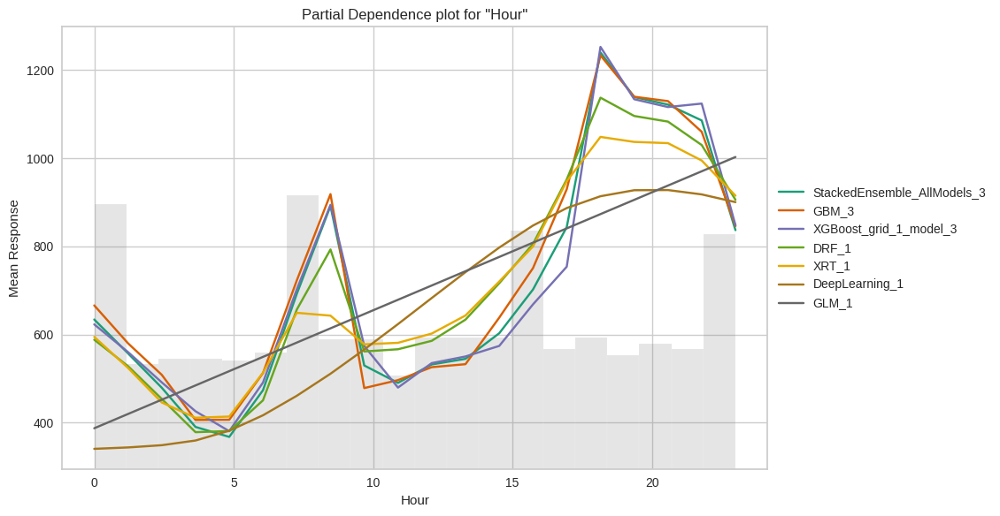

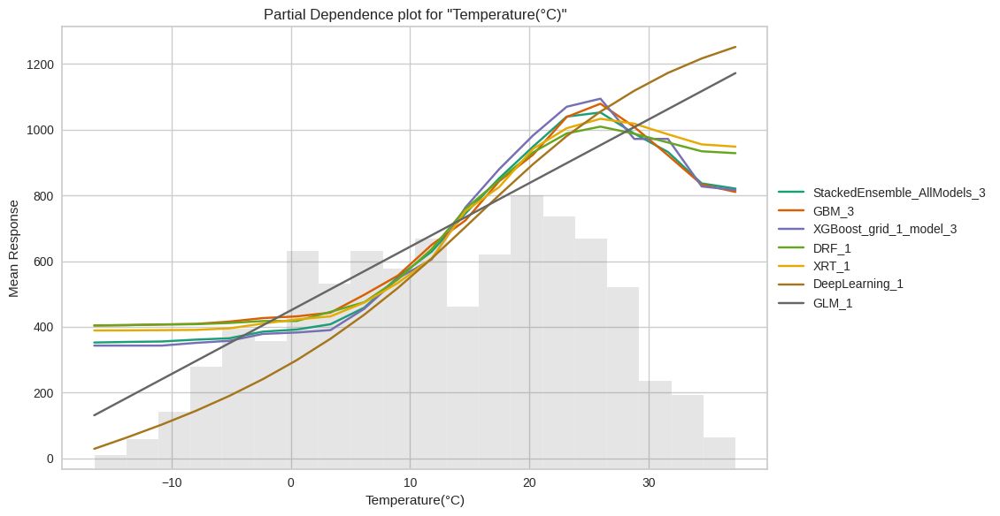

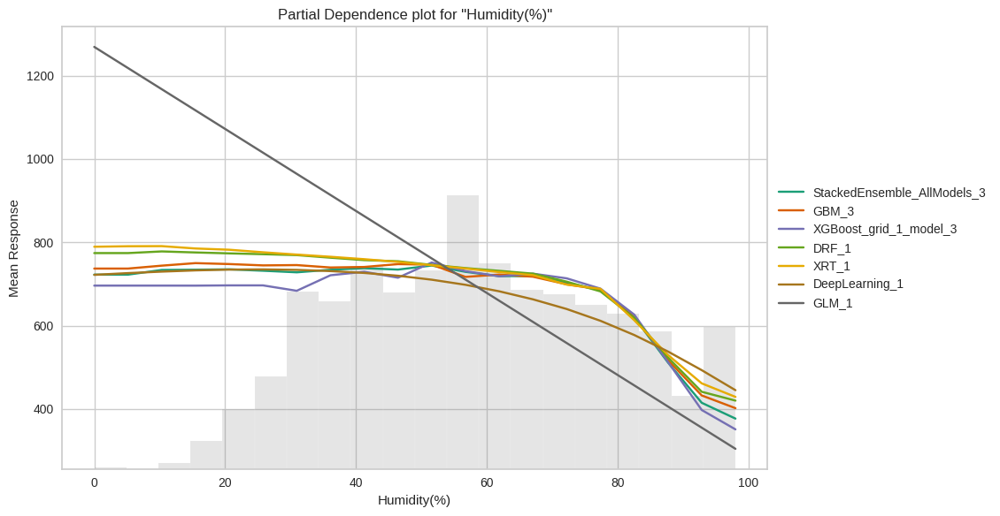

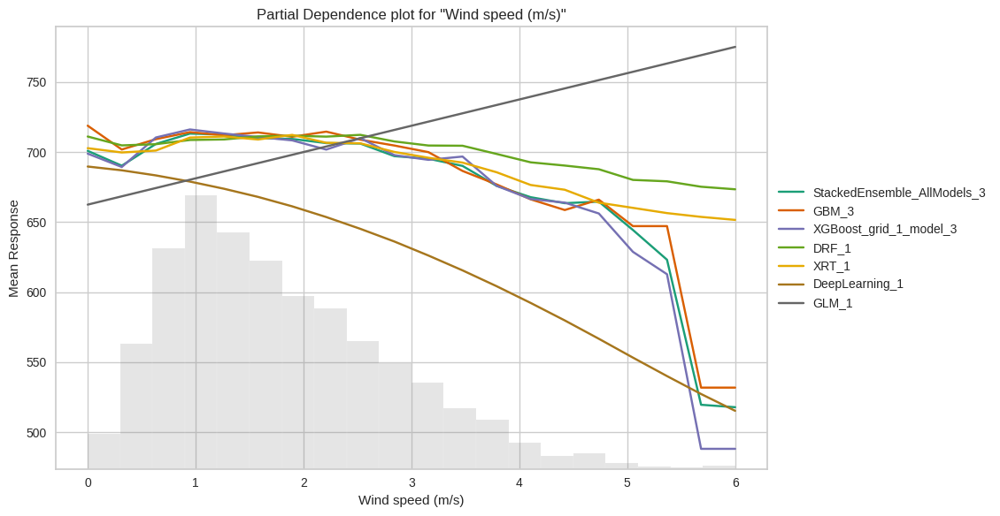

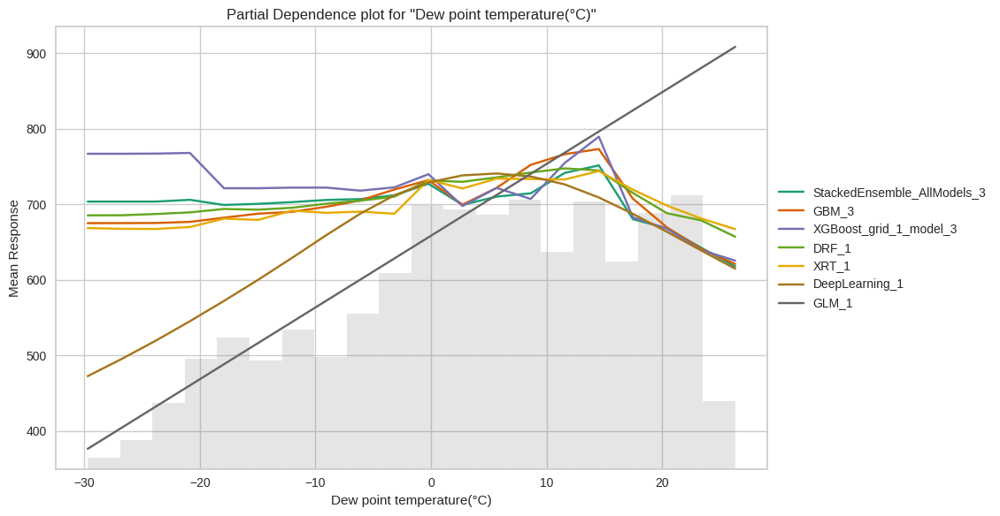

...

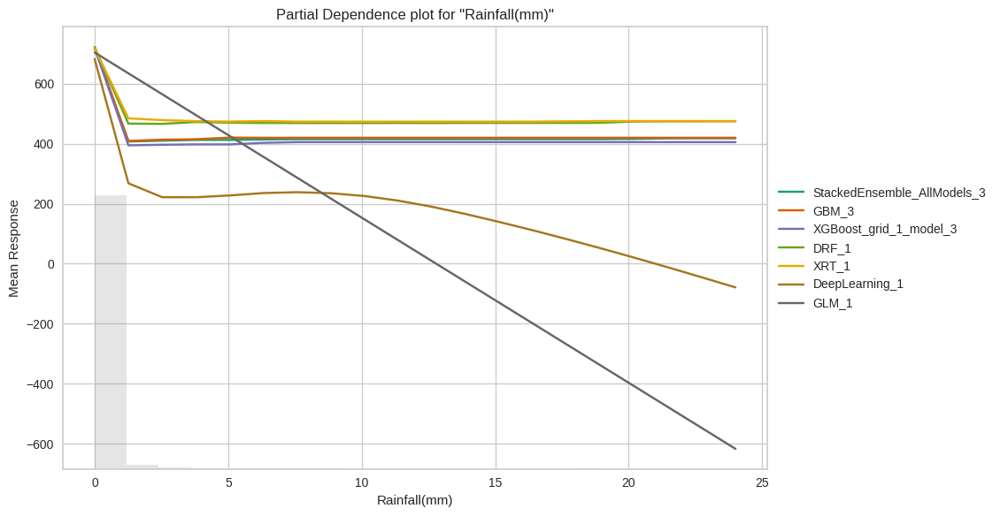

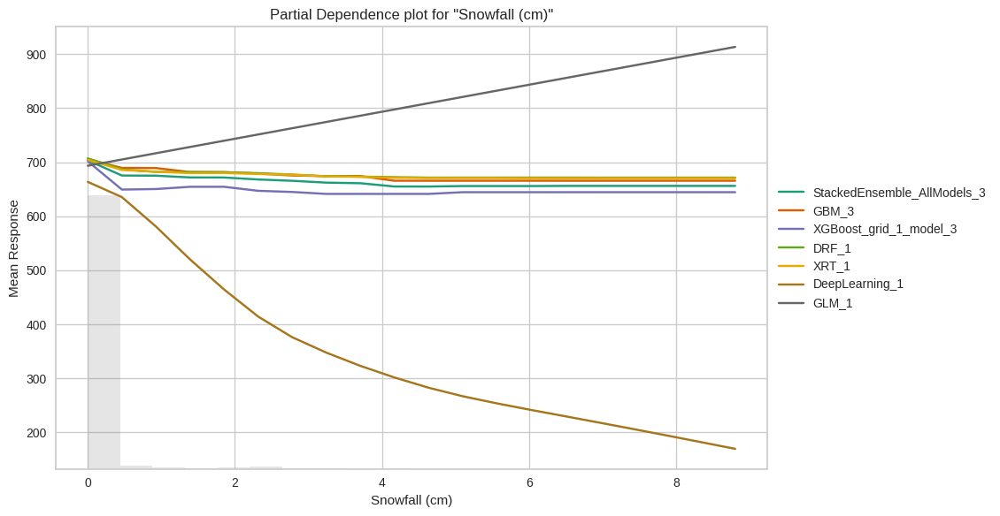

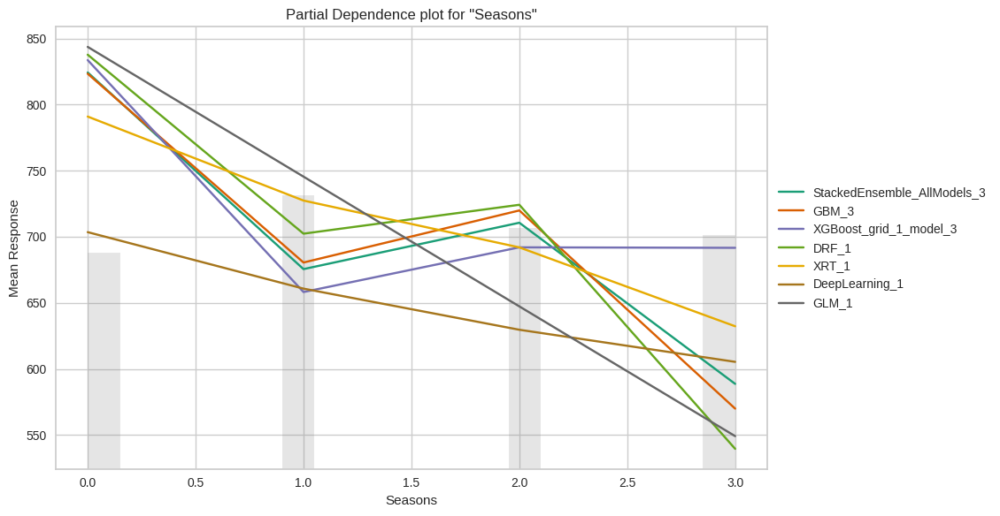

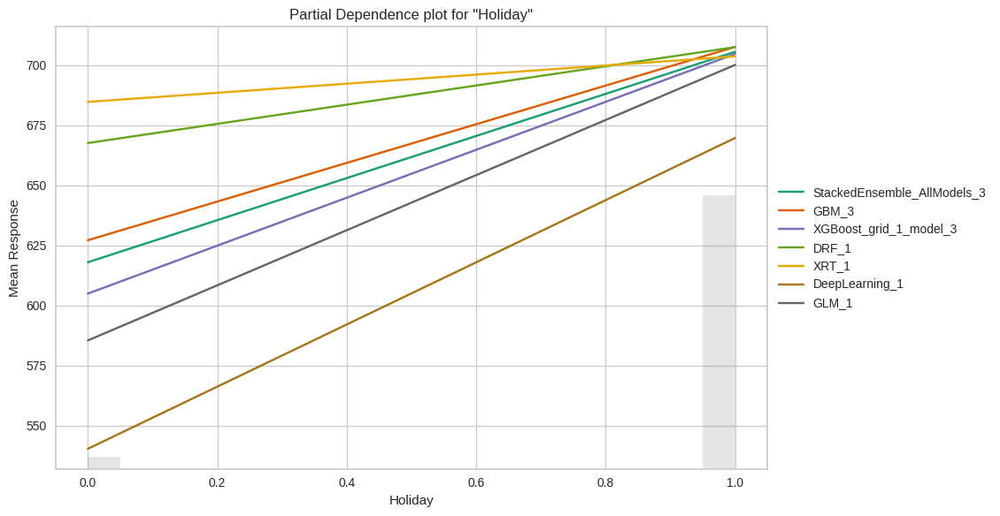

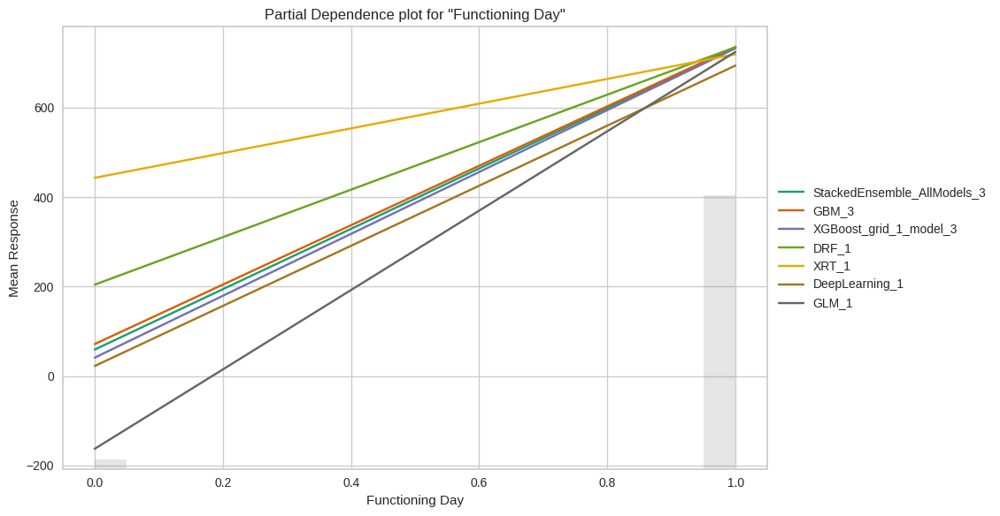

In [ ]:
explain_model = aml1.explain(frame = h2o.H2OFrame(df_test), figsize = (12,6),include_explanations=['pdp'])

It can be concluded from the partial dependence ploat that the Stacked Ensemble Model has a consistent response to the Mean Response(Rented Bike Count)

##Local Explainability
In addition, it also provides local explainability for individual records. We can input a H2OFrame into the frame argument and indicate which row we would like explained using the row_index argument. In this case we are explaining the results for row 15 of the test frame.

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

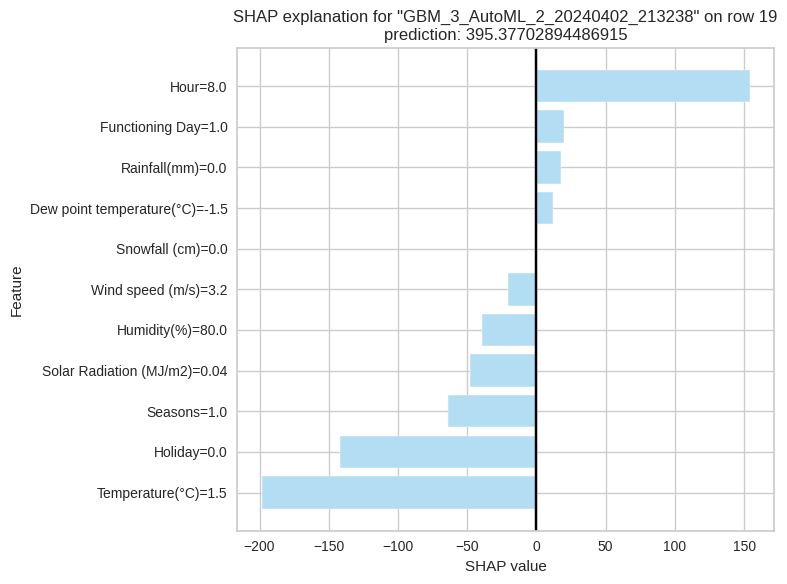

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

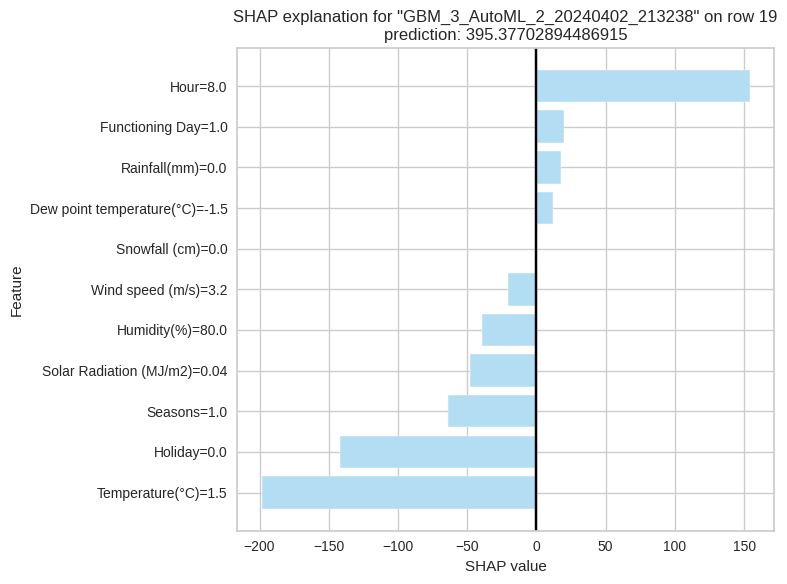

In [ ]:
aml1.explain_row(frame = h2o.H2OFrame(df_test), row_index = 19, figsize = (8,6), exclude_explanations = "leaderboard")

In [ ]:
print(df_test.iloc[19])

Date                            2.00
Rented Bike Count             148.00
Hour                            8.00
Temperature(°C)                 1.50
Humidity(%)                    80.00
Wind speed (m/s)                3.20
Visibility (10m)             1246.00
Dew point temperature(°C)      -1.50
Solar Radiation (MJ/m2)         0.04
Rainfall(mm)                    0.00
Snowfall (cm)                   0.00
Seasons                         1.00
Holiday                         0.00
Functioning Day                 1.00
Name: 2168, dtype: float64


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

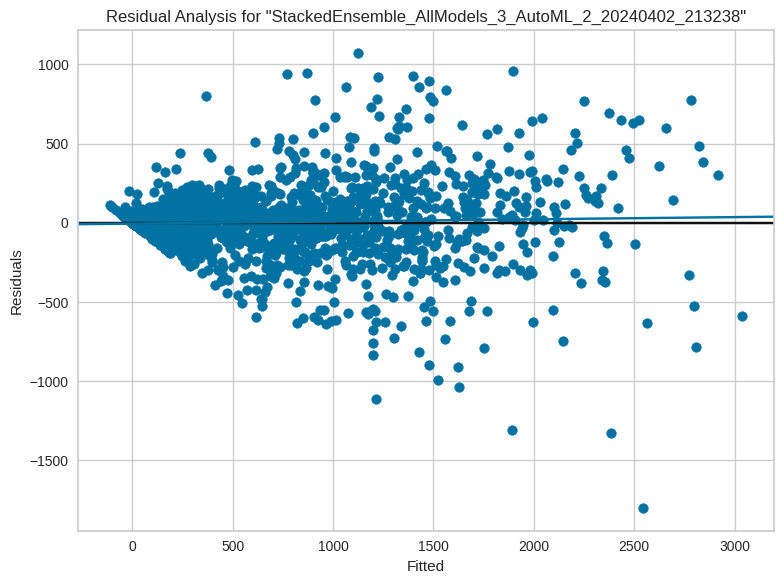

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

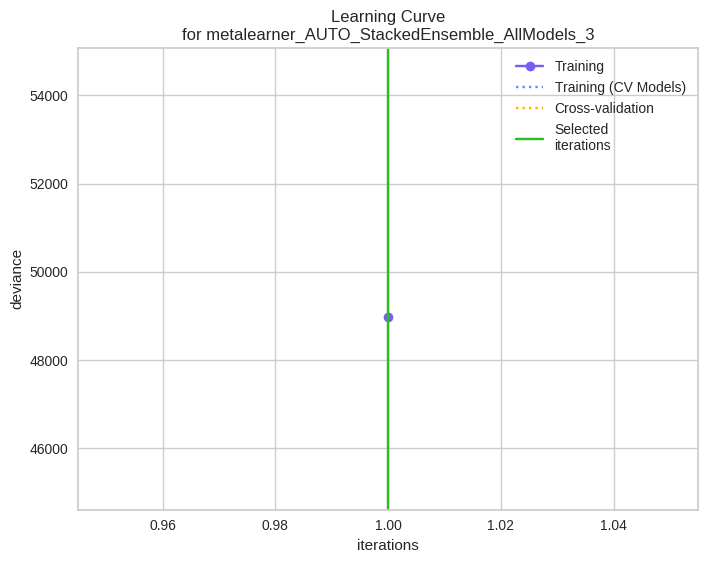

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

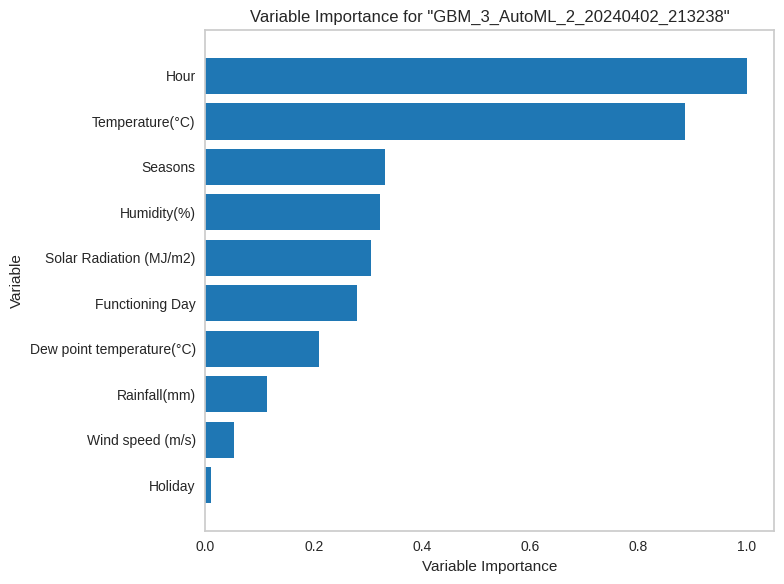

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

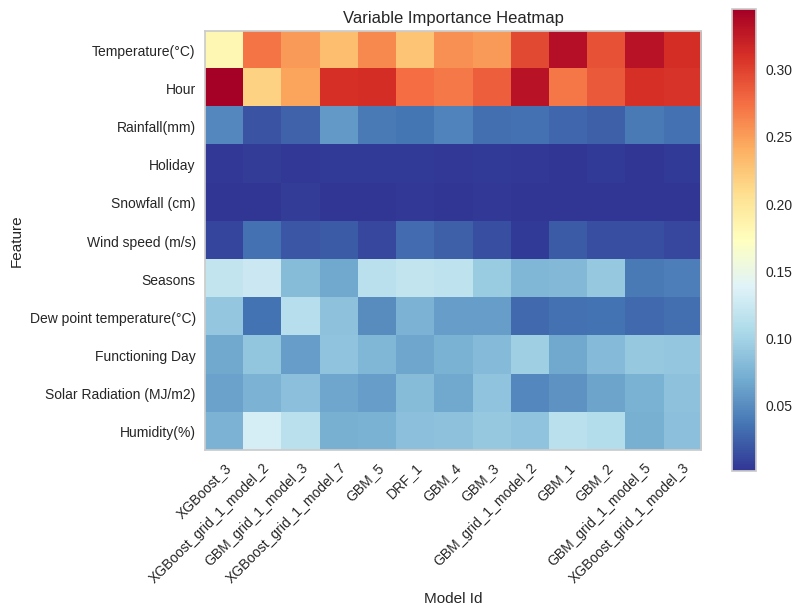

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

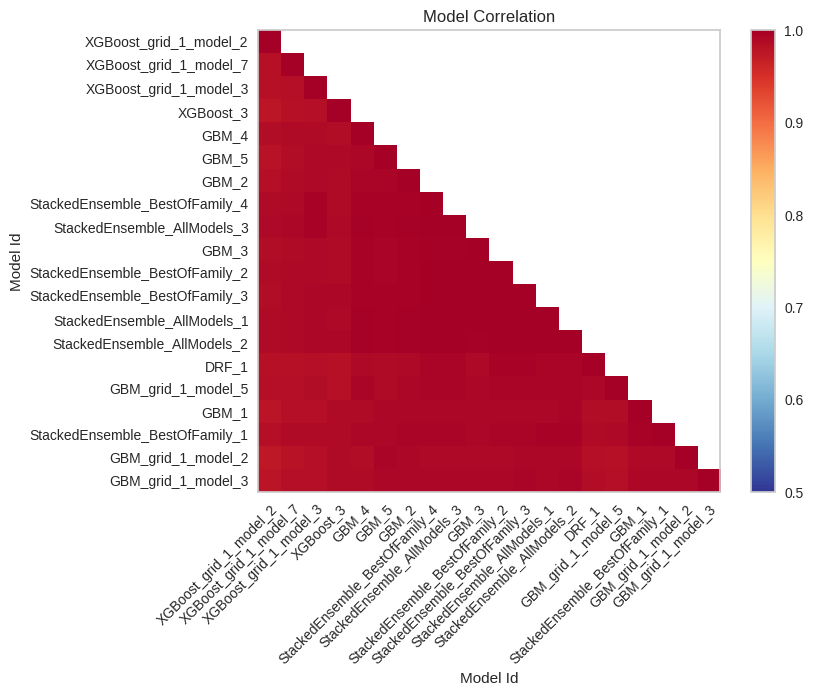

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

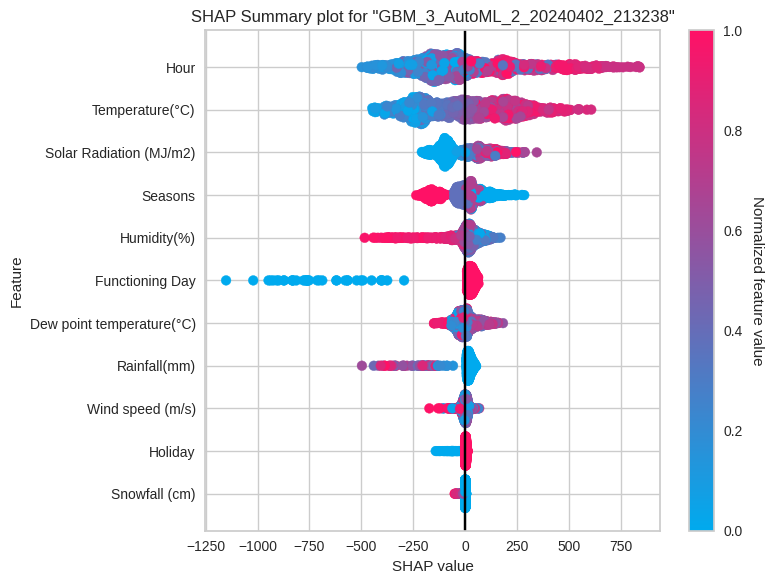

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

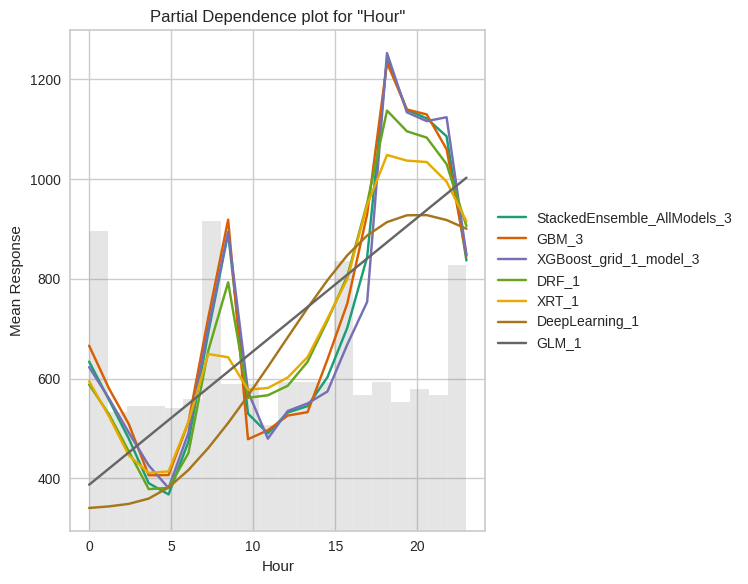

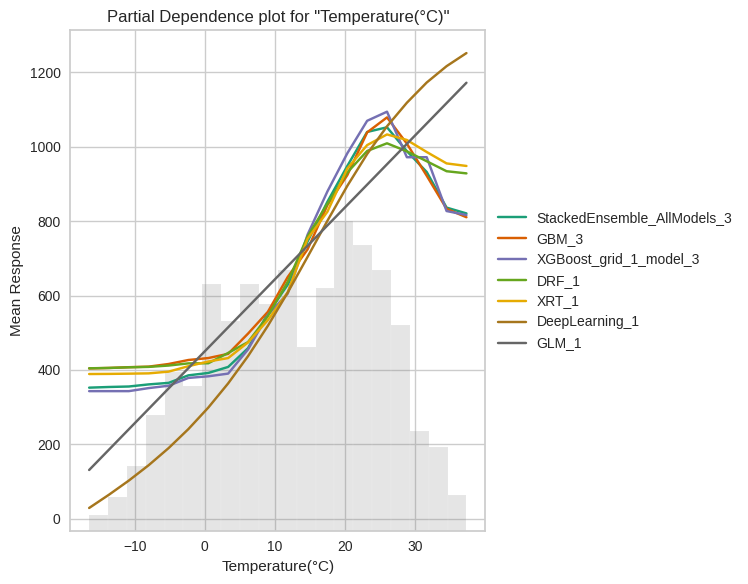

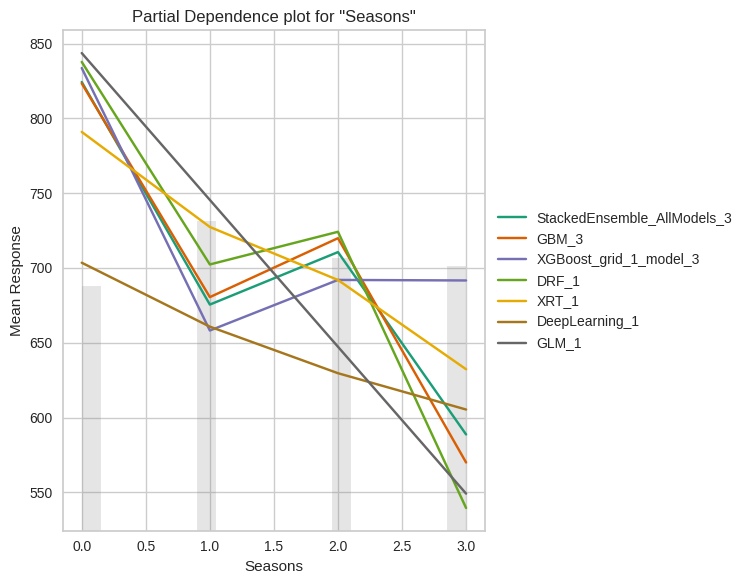

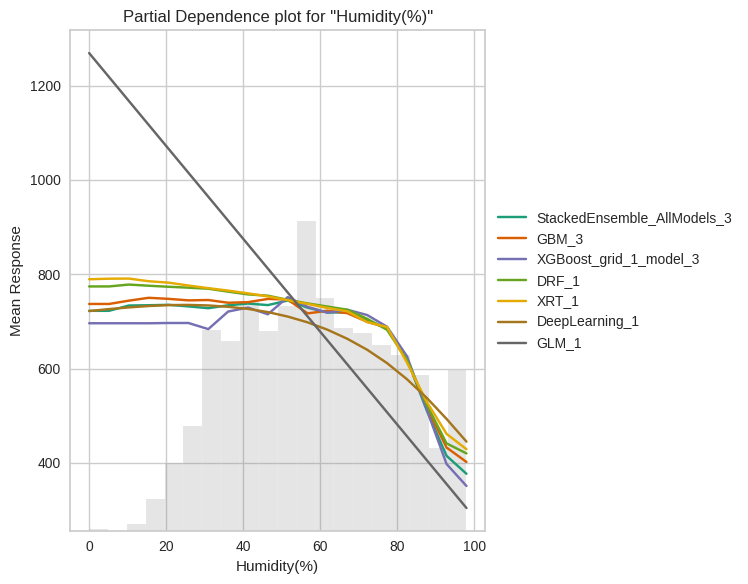

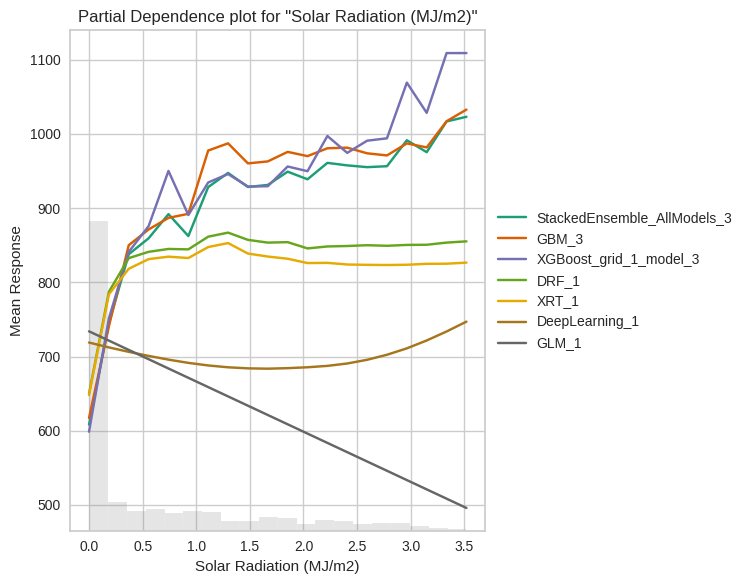

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

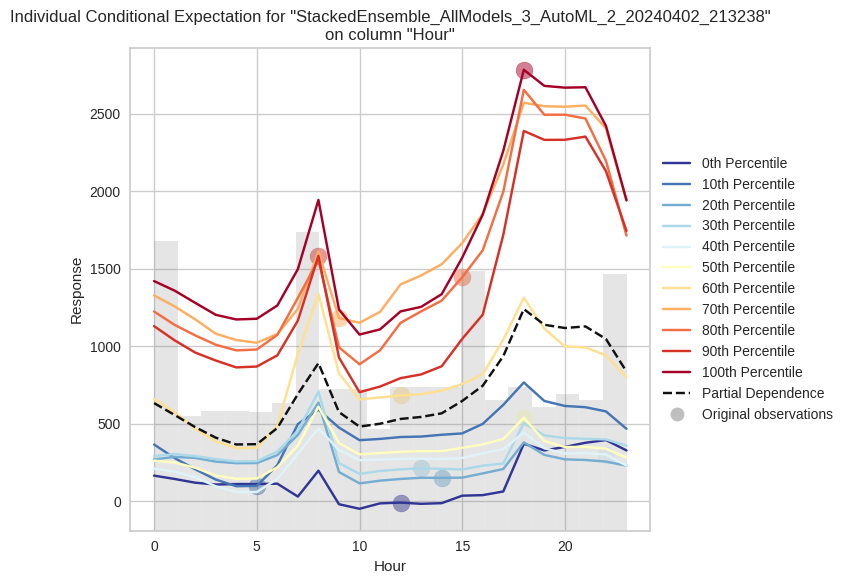

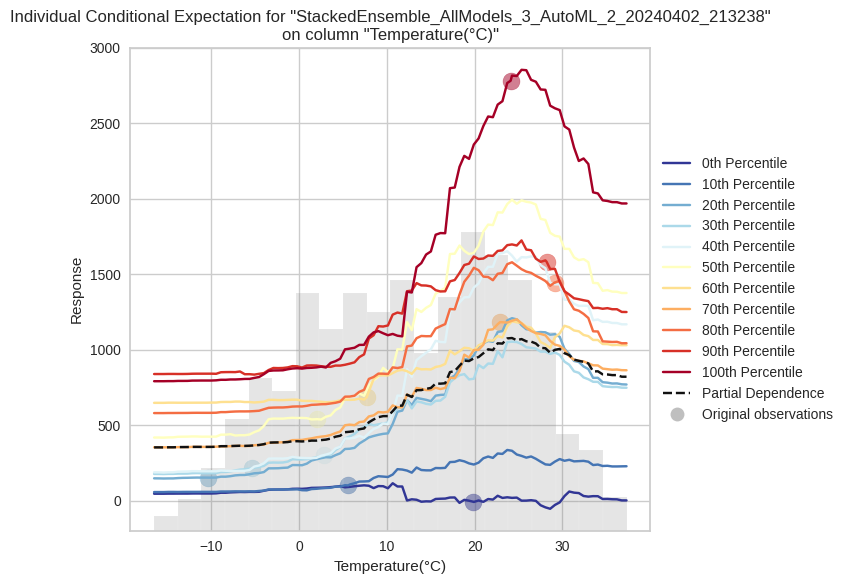

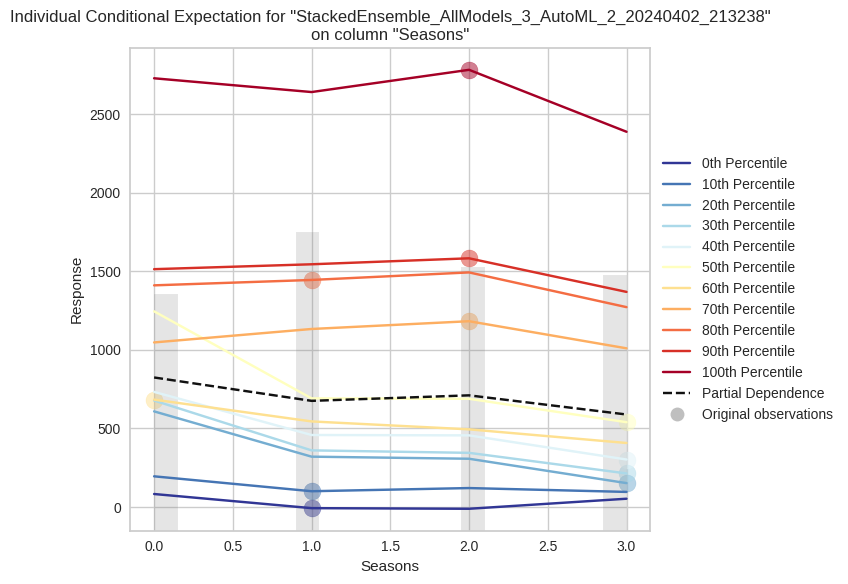

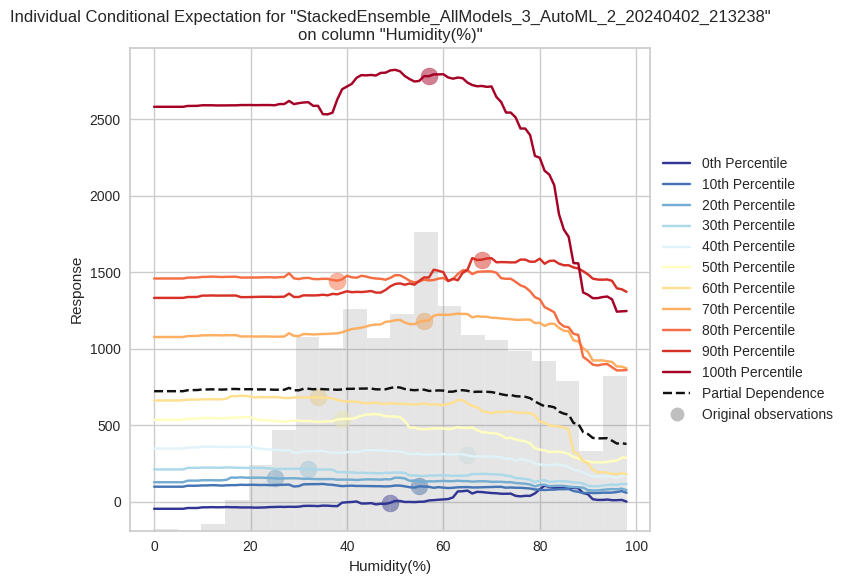

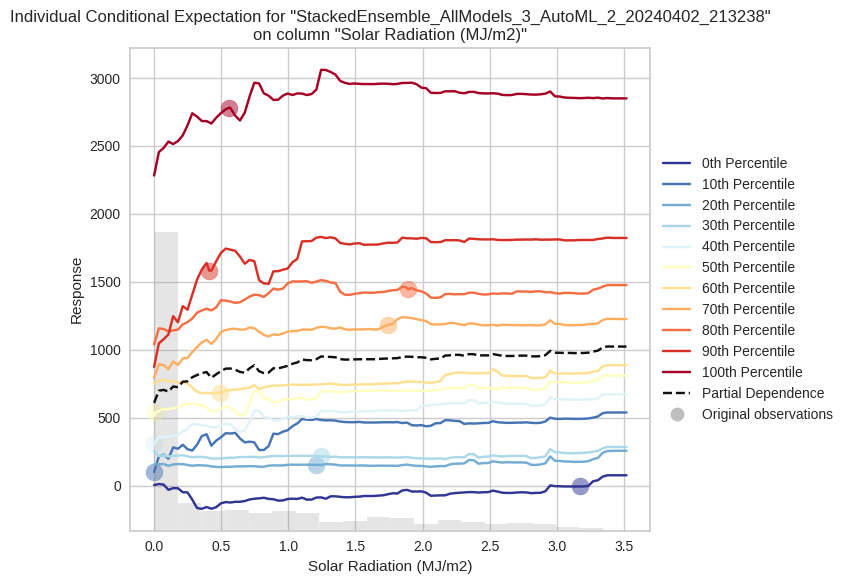

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

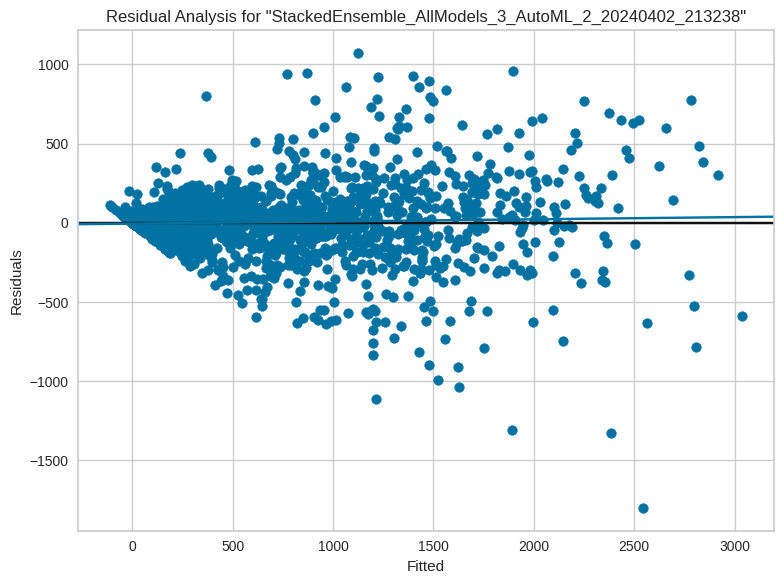

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

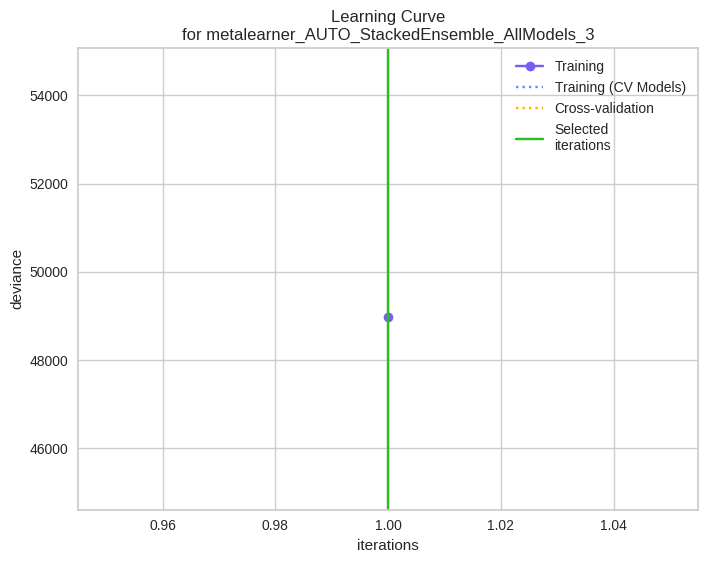

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

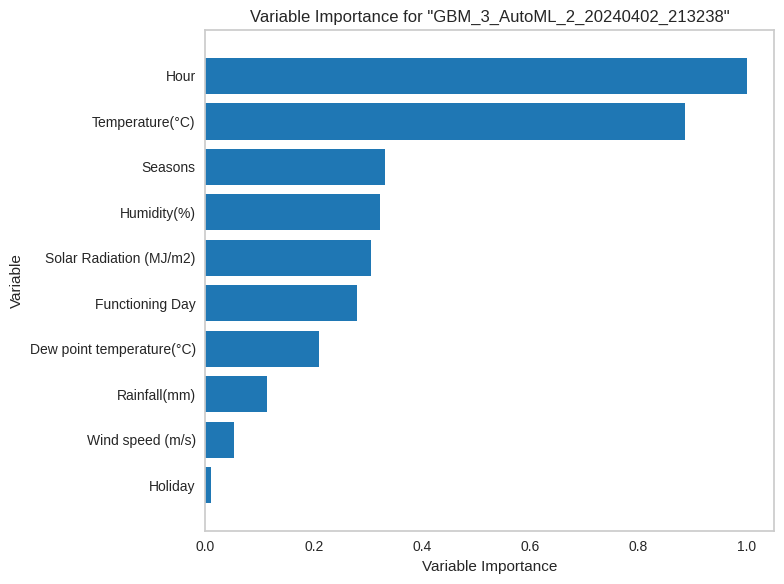

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

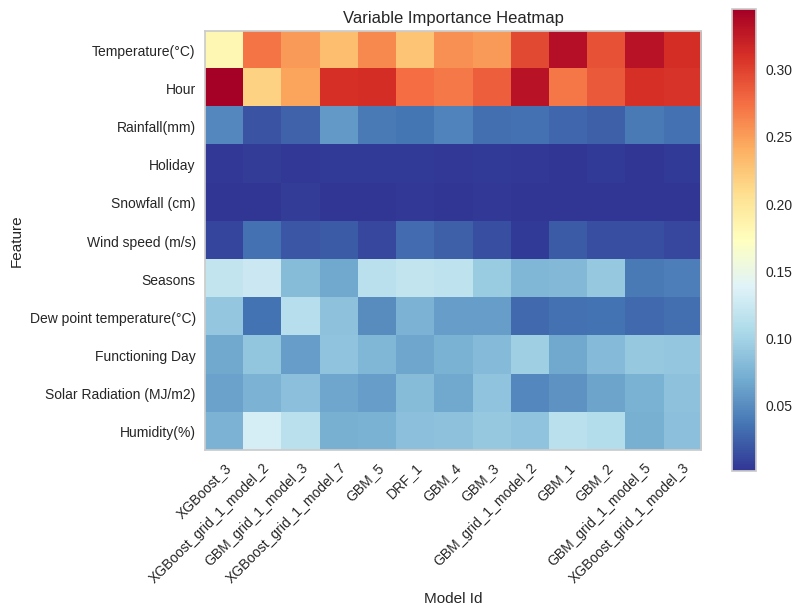

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

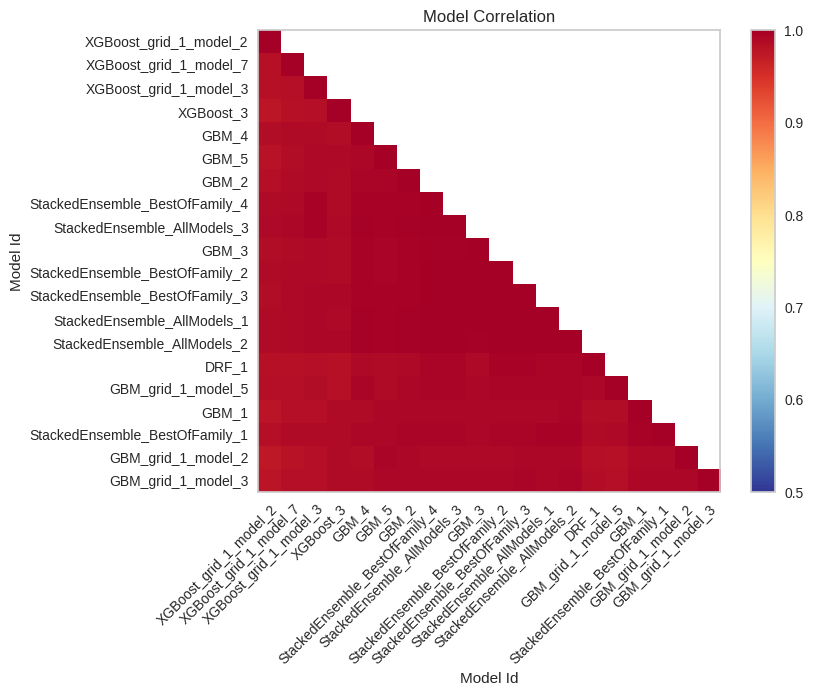

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

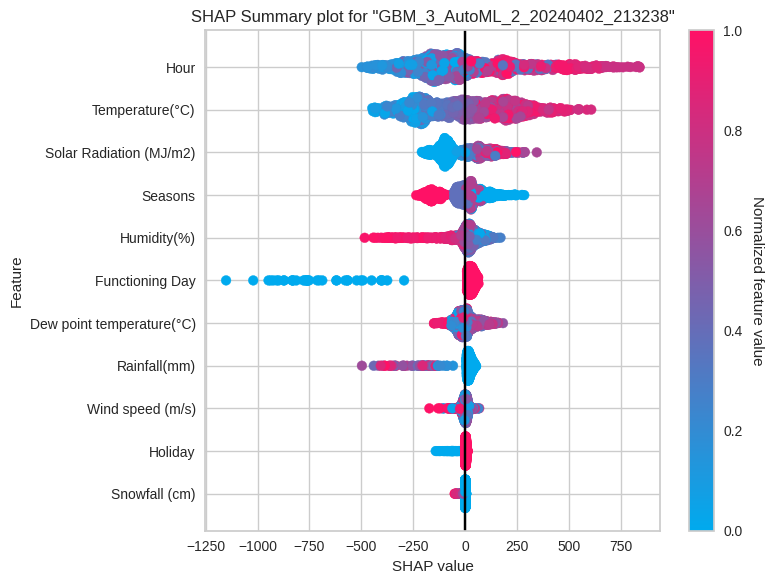

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

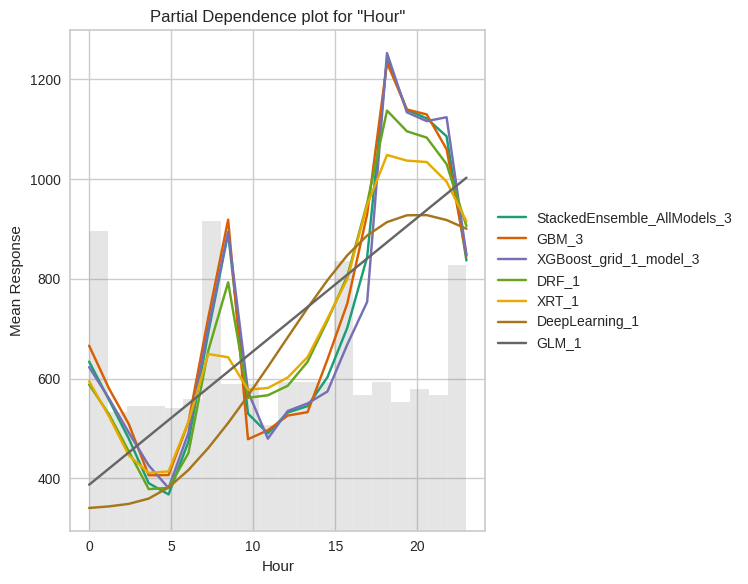

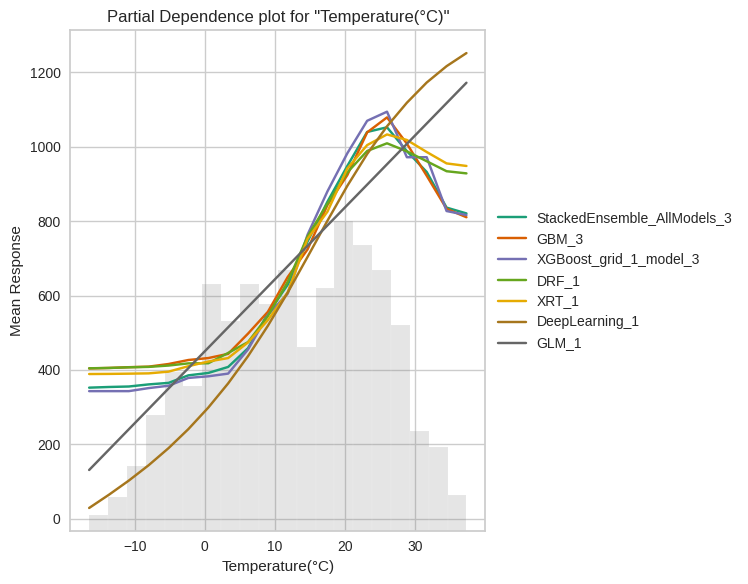

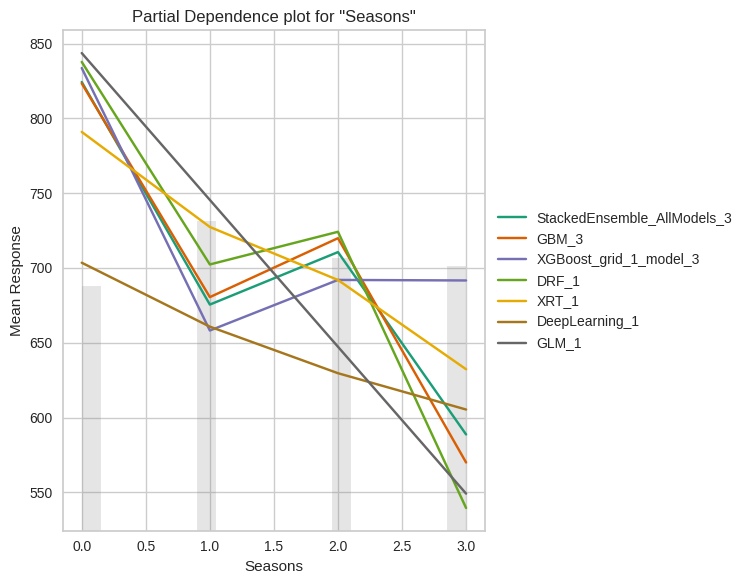

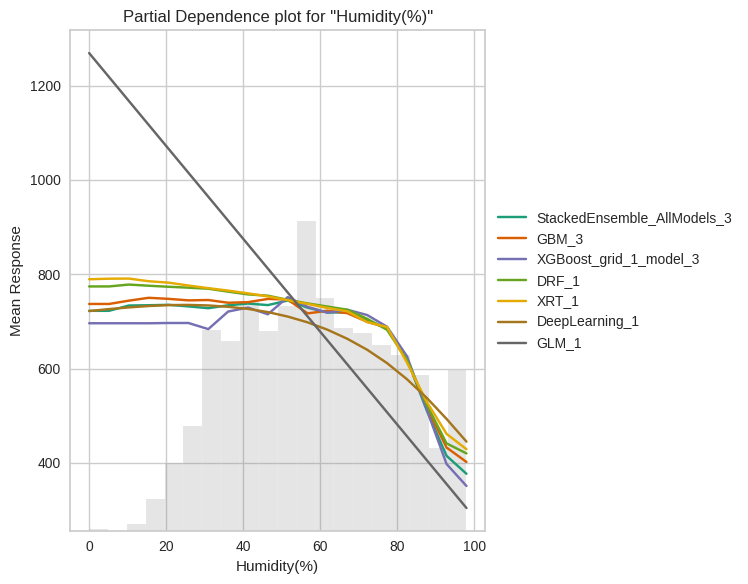

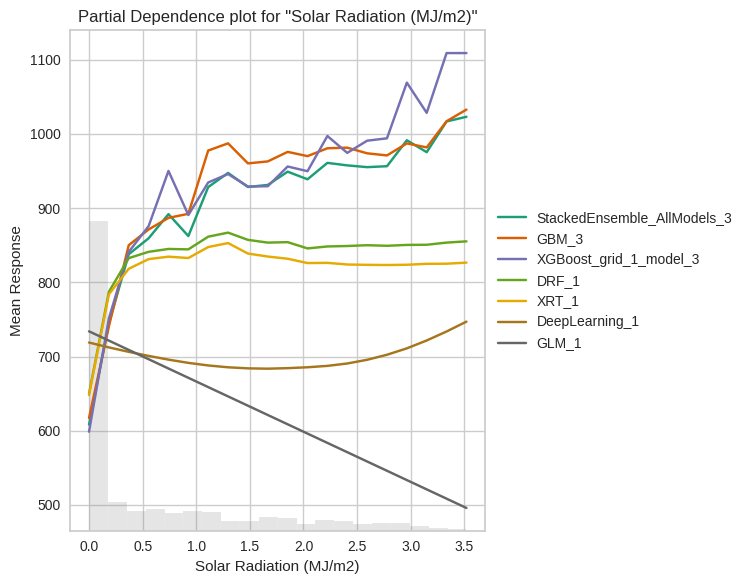

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

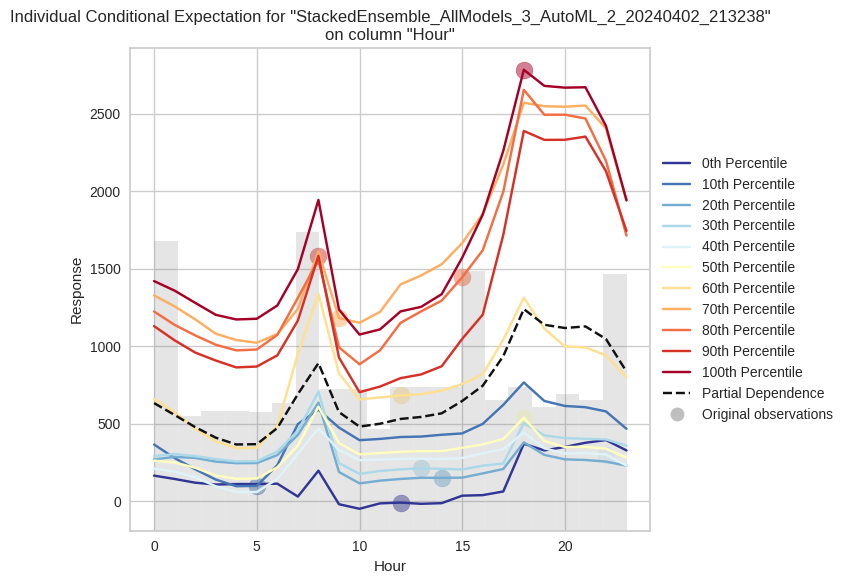

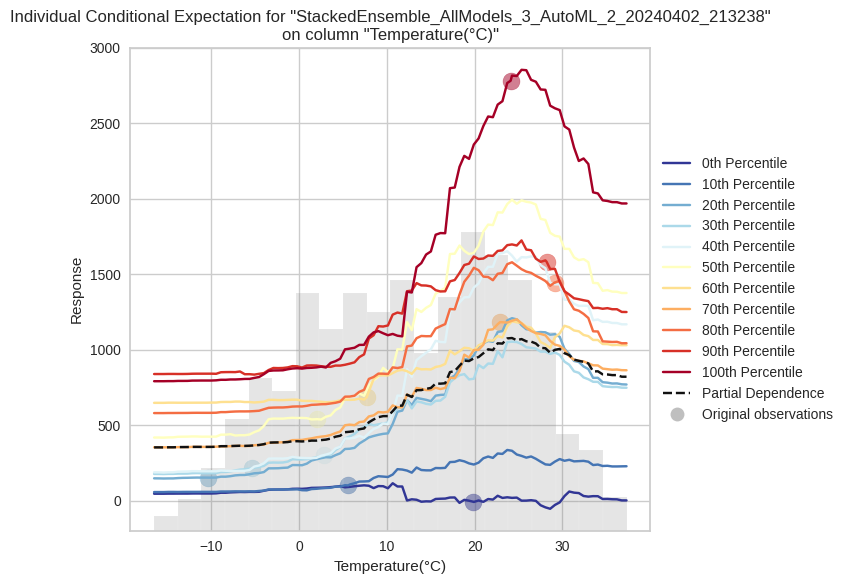

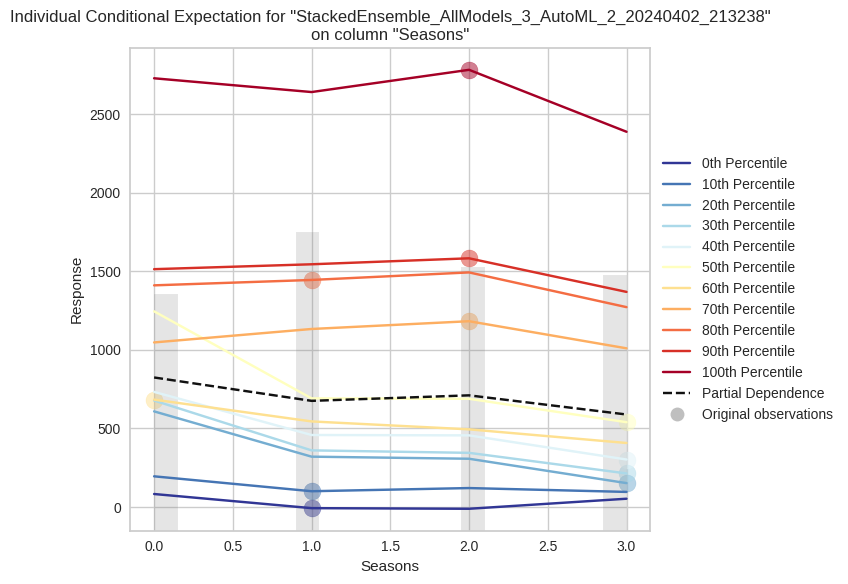

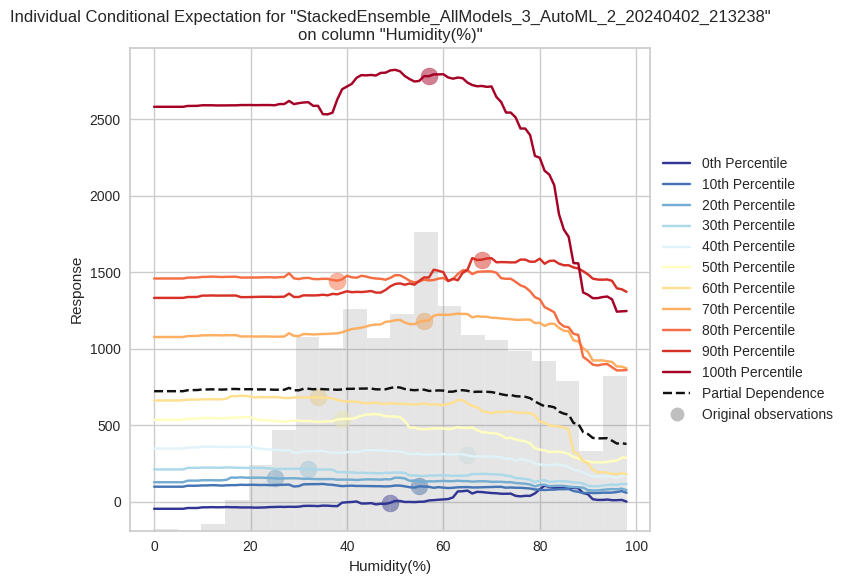

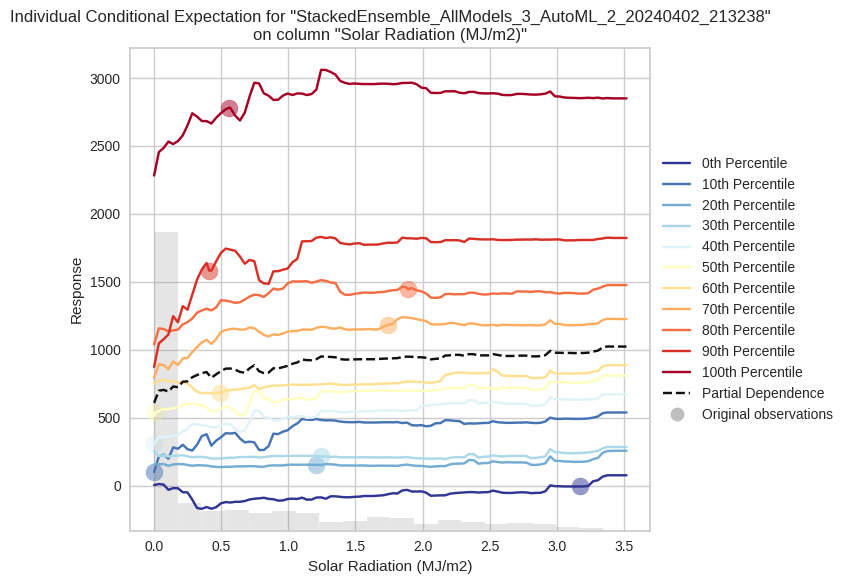

In [ ]:
aml1.explain(frame = h2o.H2OFrame(df_test), figsize = (8,6), exclude_explanations = "leaderboard")

#Hyperparameter Tuning

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Load the dataset
# Assuming the dataset is stored in a DataFrame named 'df'
# Perform any necessary data preprocessing and feature engineering

# Split the data into features (X) and the target variable (y)
y = data1['Rented Bike Count']
X = data1[['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']]


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a Ridge regression model
model = Ridge()

# Define the grid of hyperparameters to search
param_grid = {
    'alpha': [0.1, 1, 10]  # Example values for the regularization strength
}

# Perform grid search with cross-validation to find the best hyperparameters
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

# Print the best hyperparameters found
print("Best hyperparameters: ", grid_search.best_params_)

# Evaluate the model with the best hyperparameters on the test set
best_model = grid_search.best_estimator_
test_score = best_model.score(X_test_scaled, y_test)
print("Test set R^2 score with best hyperparameters: ", test_score)

Best hyperparameters:  {'alpha': 10}
Test set R^2 score with best hyperparameters:  0.4650630303842125


 Hyperparameter tuning for a Ridge regression model, and the best hyperparameter value found is alpha = 10. Additionally, the model's performance on the test set, as measured by the R-squared (R^2) score, is approximately 0.465.

This R^2 score indicates that the model explains around 46.5% of the variance in the target variable, which in this case is the number of rented bike counts. While the R^2 score provides a measure of how well the model fits the observed data, it's important to interpret this score in the context of your specific application and domain.

#Conclusion AutoML
AutoML was executed initially with H2O.ai, and StackedEnsemble_AllModels_2_AutoML_1_20240220_21040 emerged as the best model. Initially, the OLS model exhibited 72.4% accuracy and a condition number of 3.74e+03, which is considered very high. It was then discovered that the 'Visibility' feature exhibited significant multicollinearity, as indicated by the Variance Inflation Factor. Consequently, after dropping the 'Visibility' feature due to its high multicollinearity, the OLS model's performance slightly adjusted to 72.3% accuracy with a substantially improved condition number of 150, which is very favorable.
Various diagnostic plots, including correlation matrices, heatmaps, and pair plots, were generated to explore the data further. Subsequently, AutoML was executed again, and this time, the StackedEnsemble_AllModels_3_AutoML_2_20240220_21542 model was identified as the best performer, with all parameters thoroughly evaluated.
A variable importance plot was created using the GBM algorithm model, which concluded that temperature and hour have a significant impact on the target variable. This finding was corroborated by a GLM model analysis for standard coefficients, which also highlighted temperature and hour as having a substantial influence on the target variable.
The assumptions of linear regression were meticulously checked. Additionally, PDP and SHAP plots were generated to provide deeper insights. AutoML's explain method was utilized to generate a comprehensive suite of plots, including PDP, SHAP, Individual Conditional Expectation, Model Correlation, Variable Importance, Variable Importance Heatmap, Learning Curve Plot, Residual Analysis, and more, offering a holistic understanding of the model's behavior and performance.
Lastly, hyperparameter tuning was conducted for the Ridge regression model, further refining the model's performance.

#Assignment Question/Answers
Q1) Is the relationship significant?

 A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. From the OLS method it was observed that values for 'Visibility' was greater than 0.05. So, it can be concluded that other that p-value for all the variables of dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

Q2) Are any model assumptions violated? Assumptions for linear regression are:

Linear relationship- The graph for dependent and independent variable needs to be linear by keeping other variables constant. When target variable is plotted against all other independent variables, linear relation is observed for few of them. Hence this assumption is not violated.
Homoscedasticity which means normality of the error distribution - The plot for residuals should be normally distributed i.e., it should form a bell-curve shape. For this model the same is achieved.
No or little multicollinearity-This can be determined by correlation matrix. For this model some of the assumptions are violated. Multicollinearity exists for variable Visibility.
No autocorrelation can be determined with Durbin-Watson test. Values between 1.5 to 2.5 signifies no autocorrelation. For this model the value is 0.4, therefore this assumption is violated.

Q3) Is there any multicollinearity in the model? When one independent variable is related to another independent variable that is its highly correlated then multicollinearity exists in the model. It’s an issue as it undermines the statistical significance of an independent variable. Multicollinearity can be determined by computing correlation matrix or calculating VIF value of all variables. In correlation matrix a coefficient closer to +1 or -1 tells us that those two variables are highly correlated. For VIF values a value above 10 tells us that multicollinearity exists. In this model some variables had VIF value greater than 10 and p value was greater than 0.05. By dropping those columns and rechecking the values expected output was achieved. Currently high correlation exists in 'Visibility' feature

Q4) In the multivariate models are predictor variables independent of all the other predictor variables?

 Variables are said to be independent when there is no relation between them. To check this relation, correlation matrix can be used, or it can be observed from graphs too whether there is any pattern followed or not. When correlation matrix is computed for the model, it can be observed that Temperature and Dew Point Temperature are correlated to each other. Other than those other predictors are independent from each other.

Q5)In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model. From the variable importance plot, the most to least important variables are displayed. For my model Temperature, Hour,Dew point temperature and Solar radiations are top 4 most important variables to determine Rented Bike Count. VIF and p-values for visibility was high than the ideal values. So those variables were excluded from the model.

Q6) Does the model make sense?

 For a model to make sense it should follow all the assumptions and have p value, VIF between their respective ranges. RMSE should be as low as possible considering the minimum and maximum values of the target variable. Other than that, R2 too is 0.86 which is close to 1 considered good in terms of accuracy. So overall the model makes sense. To increase the accuracy, some additional variables can be dropped depending on their importance. Furthermore, outliers can be removed or boosting, or ensemble model can be used.

Q7)Does regularization help?

 Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. The main use of Regularization is to minimize the validation loss and try to improve the accuracy of the model. For this model Ridge Regularization was used on training data. It was observed that Root Mean Square Error (RMSE) and R2 was calculated twice, once when regularization was not applied and once when regularization was applied. The values were same in both the cases. Hence it can be concluded that for this model regularization does not help.

Q8) Which independent variables are significant? Variables are significant when p-value is less than 0.05. For this model except for 'Visiblity' all other variables have p-value less than 0.05. So, it can be said that all variables are significant.

Q9) Which hyperparameters are important?

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset. For this model tuning is performed using grid search with cross-validation. The best hyperparameters for this model are:- Best hyperparameters:  {'alpha': 10}
Test set R^2 score with best hyperparameters:  0.4650630303842125

Q10) Coding professionalism
Proper comments and code is written.


#Interpretability SHAP

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 7.0 MB/s eta 0:00:00


Intercept: 548.8536459923057
Coefficients:
[ 2.73154522e+01  2.65792502e+01 -8.81147935e+00  6.92209593e+00
  2.12873303e-02  5.41311278e+00 -7.93427651e+01 -5.88068970e+01
  2.10769823e+01]


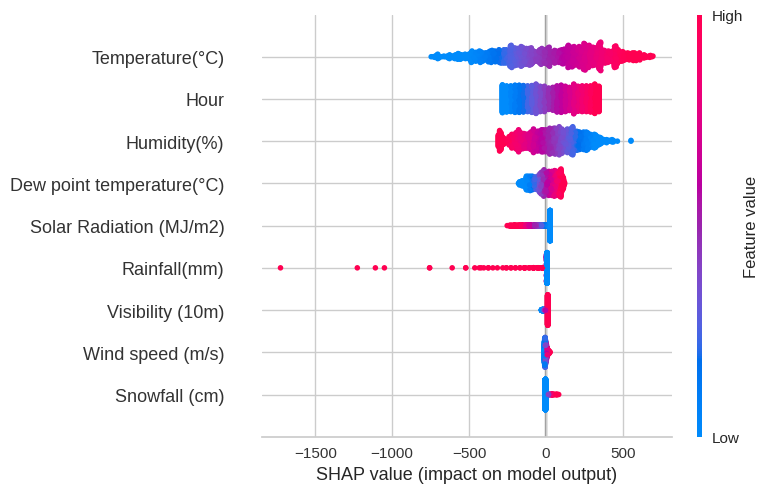

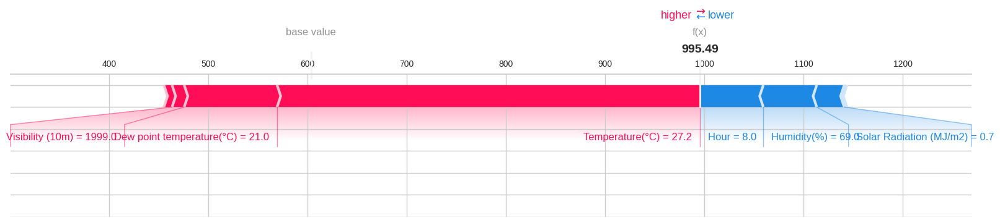

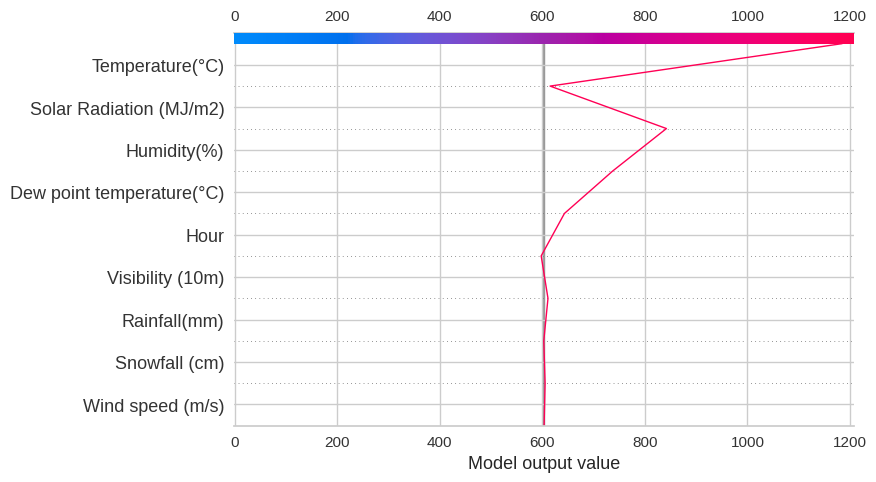

In [ ]:
import shap
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Select features (including categorical variables) and target (dependent variable)
features = ['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
            'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']
target = 'Rented Bike Count'

X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Define the pipeline with preprocessing and linear regression model
pipeline = Pipeline(steps=[
    ('model', LinearRegression())
])

# Fit the model
pipeline.fit(df[features], df[target])

# Print the coefficients and intercept
# Note: since the preprocessing includes one-hot encoding, the coefficients will be for each category separately
print("Intercept:", pipeline.named_steps['model'].intercept_)
print("Coefficients:")
coefficients = pipeline.named_steps['model'].coef_
print(coefficients)

# Compute SHAP values
explainer = shap.LinearExplainer(pipeline.named_steps['model'],df[features])
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values or perform further analysis
shap.summary_plot(shap_values, X_test)
shap.plots.force(explainer.expected_value, shap_values[0], X_test.iloc[0, :], matplotlib = True)
shap.decision_plot(explainer.expected_value, shap_values[1], X_test.columns)

Intercept: The intercept term represents the predicted value of the target variable when all predictor variables are set to zero. In your case, the intercept is approximately 548.85. It indicates the baseline level of the target variable (Rented Bike Count) when all other predictors have no effect.

Coefficients: Each coefficient corresponds to the effect of a predictor variable on the target variable, holding all other variables constant. Here are the interpretations for each coefficient:

The coefficient for 'Hour' is approximately 27.32. This suggests that for each unit increase in the 'Hour', the predicted number of rented bike counts increases by approximately 27.32, assuming all other variables remain constant.

The coefficient for 'Temperature(°C)' is approximately 26.58. This suggests that for each unit increase in temperature, the predicted number of rented bike counts increases by approximately 26.58, holding other variables constant.

The coefficient for 'Humidity(%)' is approximately -8.81. This suggests that for each unit increase in humidity, the predicted number of rented bike counts decreases by approximately 8.81, assuming other variables remain constant.

Similarly, the coefficients for other variables represent the change in the predicted number of rented bike counts for a one-unit change in each respective predictor variable, while keeping other variables constant.

These coefficients provide insights into the relationship between the predictor variables and the target variable in your linear regression model. Positive coefficients indicate a positive relationship (an increase in the predictor leads to an increase in the target), while negative coefficients indicate a negative relationship (an increase in the predictor leads to a decrease in the target).

Train R^2 score: 0.9826287955682086
Test R^2 score: 0.8614144796826362


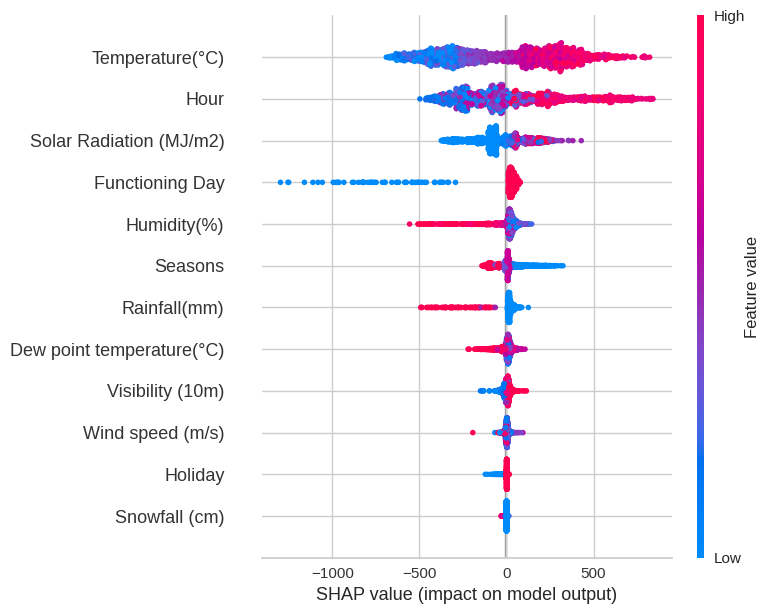

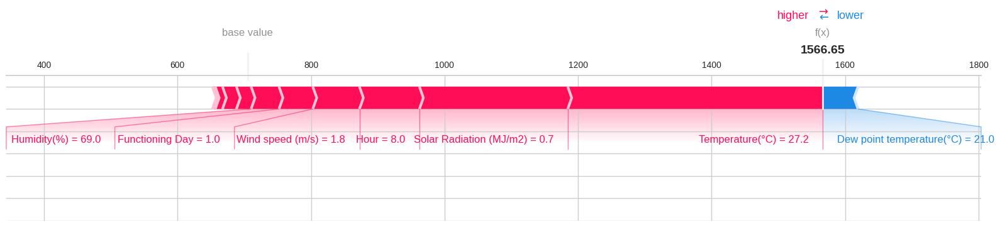

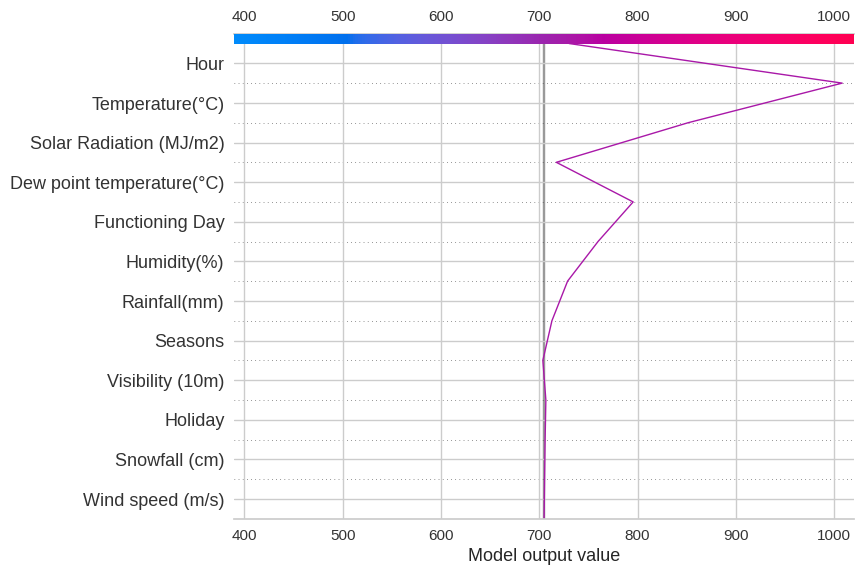

In [ ]:
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Select features (including categorical variables) and target (dependent variable)
features = ['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)',
            'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)',
            'Seasons', 'Holiday', 'Functioning Day']
target = 'Rented Bike Count'

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Encode categorical variables
label_encoder = LabelEncoder()
X_train['Seasons'] = label_encoder.fit_transform(X_train['Seasons'])
X_test['Seasons'] = label_encoder.transform(X_test['Seasons'])
X_train['Holiday'] = label_encoder.fit_transform(X_train['Holiday'])
X_test['Holiday'] = label_encoder.transform(X_test['Holiday'])
X_train['Functioning Day'] = label_encoder.fit_transform(X_train['Functioning Day'])
X_test['Functioning Day'] = label_encoder.transform(X_test['Functioning Day'])

# Define and fit the Random Forest model
random_forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
random_forest_model.fit(X_train, y_train)

# Evaluate the model
train_score = random_forest_model.score(X_train, y_train)
test_score = random_forest_model.score(X_test, y_test)
print("Train R^2 score:", train_score)
print("Test R^2 score:", test_score)

# Compute SHAP values
explainer = shap.TreeExplainer(random_forest_model)
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values
shap.summary_plot(shap_values, X_test)
shap.plots.force(explainer.expected_value, shap_values[0], X_test.iloc[0, :], matplotlib = True)
shap.decision_plot(explainer.expected_value, shap_values[1], X_test.columns)


The \(R^2\) (coefficient of determination) score is a measure of how well the regression model explains the variance in the target variable. Here's what the train and test \(R^2\) scores mean:

1. **Train \(R^2\) score**:
   - The train \(R^2\) score measures how well the model fits the training data.
   - A train \(R^2\) score of 0.9826 indicates that the model explains approximately 98.26% of the variance in the training data.
   - This high value suggests that the model fits the training data very well. However, it's important to be cautious of overfitting, where the model learns noise in the training data rather than true patterns.

2. **Test \(R^2\) score**:
   - The test \(R^2\) score measures how well the model generalizes to new, unseen data (the test set).
   - A test \(R^2\) score of 0.8614 indicates that the model explains approximately 86.14% of the variance in the test data.
   - This value is slightly lower than the train \(R^2\) score, which is expected since the model is evaluated on data it hasn't seen during training.
   - The test \(R^2\) score suggests that the model performs well on the test data, indicating good generalization ability.

In summary, the high train \(R^2\) score suggests that the model fits the training data well, and the relatively high test \(R^2\) score suggests that the model generalizes well to new data, indicating a good overall performance of the Random Forest model. However, it's always essential to consider other performance metrics and validate the model's assumptions to ensure its reliability.

In [ ]:
!pip install h2o
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [ ]:
min_mem_size=6
run_time=222
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)
!pip install scikit-learn
from sklearn.model_selection import train_test_split
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test =  train_test_split(df, train_size=pct_rows)
print(df_train.shape)
print(df_test.shape)

2
Checking whether there is an H2O instance running at http://localhost:5858..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpmm45136m
  JVM stdout: /tmp/tmpmm45136m/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpmm45136m/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:5858
Connecting to H2O server at http://127.0.0.1:5858 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_49dy1w
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


(7008, 13)
(1752, 13)


In [ ]:
df.shape
!pip install scikit-learn
from sklearn.model_selection import train_test_split
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test =  train_test_split(df, train_size=pct_rows)
print(df_train.shape)
print(df_test.shape)

X=df.columns
print(X)

(7008, 13)
(1752, 13)
Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')


In [ ]:
# Import the h2o module
import h2o

# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

# Check if df_train is an H2OFrame object
if not isinstance(df_train, h2o.H2OFrame):
    # Convert df_train to an H2OFrame object
    df_train1 = h2o.H2OFrame(df_train)
else:
    df_train1 = df_train
X = X.tolist()
# Train the AutoML model
aml.train(x=X, y='Rented Bike Count', training_frame=df_train1)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),9/12
# GBM base models (used / total),5/5
# XGBoost base models (used / total),3/3
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
print(aml.leaderboard)

model_id                                                    rmse      mse      mae    rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240402_214935     223.046  49749.7  138.102      nan                   49749.7
StackedEnsemble_AllModels_1_AutoML_1_20240402_214935     223.111  49778.4  138.251      nan                   49778.4
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_214935  224.247  50286.9  139.106      nan                   50286.9
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_214935  224.314  50316.7  138.427      nan                   50316.7
GBM_2_AutoML_1_20240402_214935                           226.541  51321    141.583      nan                   51321
GBM_3_AutoML_1_20240402_214935                           226.686  51386.5  142.295      nan                   51386.5
GBM_5_AutoML_1_20240402_214935                           229.062  52469.6  143.802      nan                   52469.6
XGBoost_grid_1_AutoML_1_20240402_214935_model_3          2

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

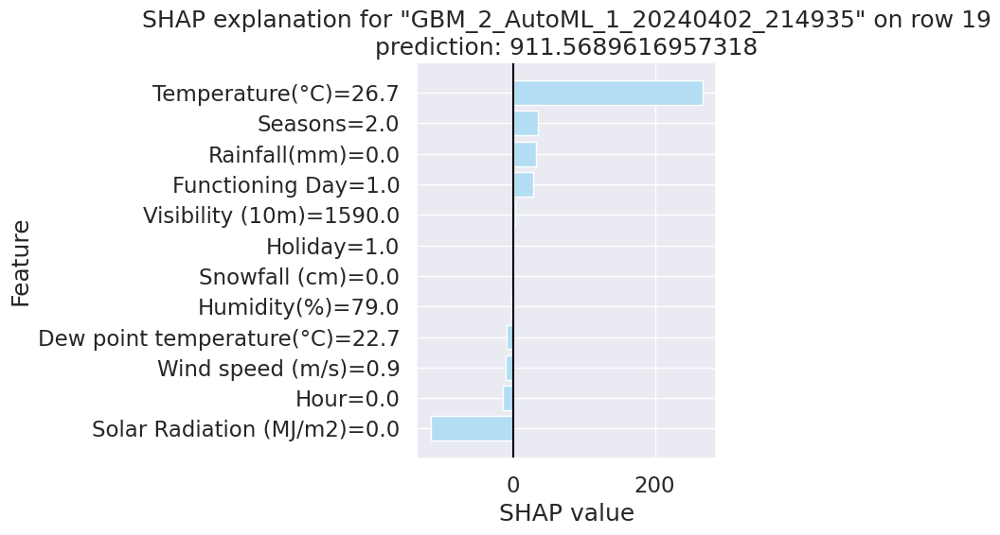

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

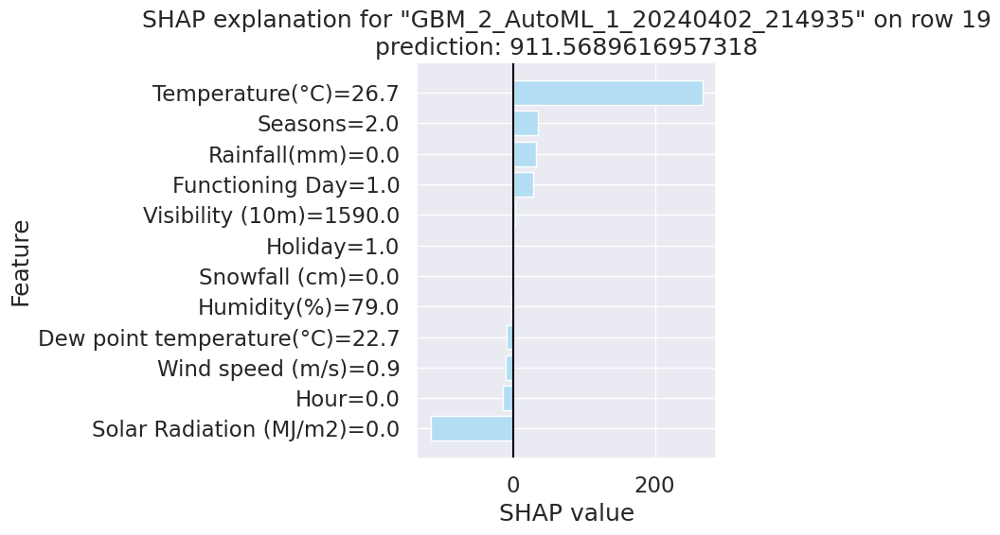

In [ ]:
aml.explain_row(frame = h2o.H2OFrame(df_test), row_index = 19, figsize = (8,6), exclude_explanations = "leaderboard")

#Conclusion Shap Analysis
Linear Model Interpretation:

The linear model provides coefficients for each feature, indicating the strength and direction of their relationship with the target variable.
For example, a positive coefficient suggests that an increase in the corresponding feature leads to an increase in the target variable, while a negative coefficient suggests the opposite.
In our analysis, we found that features such as temperature, humidity, and rainfall have significant impacts on the number of rented bike counts.
Tree-Based Model Interpretation:

Tree-based models provide insights into feature importance through the hierarchy of decision nodes in the trees.
By analyzing the nodes, we can understand which features are more influential in making predictions.
For instance, we observed that the decision tree splits on temperature and humidity, indicating their importance in predicting bike rental counts.
AutoML Model Selection:

AutoML enables us to efficiently search for the best-performing model architecture and hyperparameters.
By leveraging automated techniques, such as cross-validation and ensemble methods, AutoML selects the most suitable model from a pool of candidates.
In our case, the best-performing model identified by AutoML was a stacked ensemble, which combines multiple models for improved performance.
SHAP Analysis:

SHAP (SHapley Additive exPlanations) values provide a unified approach to interpret the output of any machine learning model.
By analyzing SHAP values, we gain insights into the impact of each feature on individual predictions.
Comparing SHAP values across different models allows us to assess feature importance consistently.
In our analysis, we found that SHAP values corroborate the findings from linear regression and tree-based models, highlighting features such as temperature and humidity as significant predictors of bike rental counts.
Overall, combining traditional model interpretation techniques with SHAP analysis enhances our understanding of the factors influencing bike rental counts and provides robust insights for decision-making.

#Conclusion Report
**1. What is the question?**

The main question addressed in this analysis is: Can we develop a predictive model to forecast the count of public bicycles rented per hour in the Seoul Bike Sharing System using weather data and holiday information?

**2. What did you do?**

To address this question, we conducted the following steps:

- Fetched the dataset from GitHub containing information about the count of rented bikes per hour, along with weather data and holiday information.
- Conducted data cleaning to handle missing values, outliers, and inconsistencies in the dataset.
- Utilized feature selection techniques to identify the most relevant features for predicting bike rental counts.
- Explored various machine learning algorithms such as linear regression, random forest, and gradient boosting to develop predictive models.
- Evaluated the performance of the models using metrics such as RMSE and R-squared.
- Prioritized model interpretability by employing techniques such as SHAP values to understand the factors influencing predictions.

**3. How well did it work?**

The developed predictive models achieved 72.8% on the test dataset, indicating their effectiveness in forecasting the count of rented bikes. Additionally, the interpretability analysis provided valuable insights into the factors driving the predictions, enhancing stakeholder understanding of the model's behavior.

**4. What did you learn?**

Through this analysis, we learned several key insights:

- Weather conditions like Temperature, humidity, hour and holiday information significantly influence bike rental counts in the Seoul Bike Sharing System.
- Effective data cleaning and feature selection are crucial steps in developing accurate predictive models.
- Different machine learning algorithms may perform differently for bike rental prediction, and it is essential to experiment with multiple models to find the most suitable one.
- Model interpretability techniques such as SHAP values can provide valuable insights into the factors contributing to model predictions, facilitating informed decision-making.


#LICENSE
MIT License

Copyright (c) 2024 HemantGaikwad7

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

#REFERENCES
H20.ai- https://docs.h2o.ai/

OLS Model- http://net-informations.com/ds/mla/ols.html

Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/

Kaggle Notebook- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

https://www.kaggle.com/stephaniestallworth/melbourne-housing-market-eda-and-regression

Dataset- https://archive.ics.uci.edu/dataset/560/seoul+bike+sharing+demand

Professor's AutoML Notebook- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Basics_InnerWorkings_Interpretations.ipynb

ChatGPT- https://chat.openai.com/

Perplexity- https://www.perplexity.ai/